# Overview of the data

In [103]:
import numpy as np
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")
import PIL


In [2]:
data=pd.read_json('tops_fashion.json')

In [3]:
data.head(2)

,asin,author,availability,availability_type,brand,color,editorial_reivew,editorial_review,formatted_price,large_image_url,manufacturer,medium_image_url,model,product_type_name,publisher,reviews,sku,small_image_url,title
0,B016I2TS4W,None,None,None,FNC7C,None,NaN,Minions Como Superheroes Ironman Women's O Nec...,None,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[False, https://www.amazon.com/reviews/iframe?...",None,https://images-na.ssl-images-amazon.com/images...,Minions Como Superheroes Ironman Long Sleeve R...
1,B01N49AI08,None,None,None,FIG Clothing,None,NaN,Sizing runs on the small side. FIG® recommends...,None,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[False, https://www.amazon.com/reviews/iframe?...",None,https://images-na.ssl-images-amazon.com/images...,FIG Clothing Womens Izo Tunic


In [4]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [5]:
data.columns

Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')

In [6]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [7]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 7


In [8]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


# Missing data for Various features

In [9]:
data['product_type_name'].describe()

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object

In [10]:
#Name of the different product type
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [11]:
#find the most frequent type of the products
product_type_count=Counter(list(data['product_type_name']))

In [12]:
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

# Basic stats on the Brand feature

In [13]:
#total data 183138
data['brand'].describe()


count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object

In [14]:
#There is some missing data
# 183138 - 182987 

In [15]:
print(data['brand'].unique())

['FNC7C' 'FIG Clothing' 'Focal18' ..., 'Z' "Rain's Pan Jacket"
 'FFLMYUHULIU']


In [16]:
#find the top ten brands
brand_count=Counter(list(data['brand']))
brand_count.most_common(10)


[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

# Basic stats for the feature : color

In [17]:
print(data['color'].describe())

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [18]:
print(data['color'].unique())

[None 'Onyx Black/ Stone' 'Grape' ..., 'Combo C'
 'White, Soft Coral and Charcoal Varigated' 'Monochrome Plaid']


In [19]:
color_count=Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

# Basic stats for the feature: formatted_price

In [20]:
print(data['formatted_price'].describe())

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [21]:
print(data['formatted_price'].unique())

[None '$26.26' '$9.99' ..., '$16.05' '$88.29' '$28.05']


In [22]:
price_count=Counter(list(data['formatted_price']))
price_count.most_common(10)


[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

# Basic stats of the feature:Title

In [23]:
data['title'].describe()

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object

In [24]:
data.to_pickle('pickels/180k_apparel_data')

In [25]:
#Removing the column for those proice is None
data=data.loc[~data['formatted_price'].isnull()]
print('Number of the datapoints after removing null price',data.shape[0])

Number of the datapoints after removing null price 28395


In [26]:
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


In [27]:
data.to_pickle('pickels/28k_apparel_data')

# Remove near Duplicate items

In [28]:
data=pd.read_pickle('pickels/28k_apparel_data')

In [29]:
#find the number of products having duplicate titles
print(sum(data.duplicated('title')))

2325


In [30]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [31]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


In [32]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [33]:
data=pd.read_pickle('pickels/16k_apperal_data')

In [34]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel O Nec...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Fifth Degree Womens Gold Foil Graphic Tees Jun...,$6.95


In [35]:
print('After removing the duplicate',data.shape[0])

After removing the duplicate 16042


# Text Preprocessing

In [36]:
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)
def nlp_preprocessing(total_text,index,column):
    if (total_text) is not int:
        string = ""
        for words in total_text.split():
            
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'what', 'at', 'ain', "mightn't", 'that', 'won', 'had', 'and', 'between', 'on', "wouldn't", 'can', 'above', 'should', "that'll", "hasn't", 'ours', 'yourself', "you'll", 'he', 'him', 'herself', 'to', 'were', 'did', 'they', 'don', 'through', "should've", 'yours', 'who', 'out', 'here', 'few', 'but', 'when', 'itself', 'more', "mustn't", 'we', 'this', 'some', "you're", 'yourselves', "isn't", 'themselves', 'doesn', 'or', 'by', "didn't", 'you', 'hers', 'm', 'be', "doesn't", 'has', "haven't", 'no', 'have', 'each', 'under', 'below', "shan't", "weren't", 'into', 'needn', 'there', 'for', 'which', 'until', 'ourselves', 'weren', 'where', 'off', "couldn't", 'those', 'their', 'theirs', 'does', 's', 'own', 'our', 'as', 'how', 'if', 'such', 'than', 'the', 'o', 'are', 'd', 'further', 'now', 'hadn', 'isn', 'during', "you've", 'doing', 'of', 'then', 'ma', 'against', 'will', 'with', 't', "aren't", 'again', 'most', 'while', 'she', 'mustn', 'an', 'about', 'down', "shouldn't", 'll', 'over'

In [37]:
start_time = time.clock()
for index, row in data.iterrows():
    nlp_preprocessing(row['title'],index,'title')
print(time.clock() - start_time, "seconds")    

2.6412487633344326 seconds


In [38]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

# Text based product similarity

In [39]:
data=pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [104]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = PIL.Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
def plot_heatmap(keys, values, labels, url, text):

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

# Bag of Words on the product titles

In [41]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

In [42]:
title_vectorizer=CountVectorizer()
title_features=title_vectorizer.fit_transform(data['title'])
title_features.get_shape()

(16042, 12609)

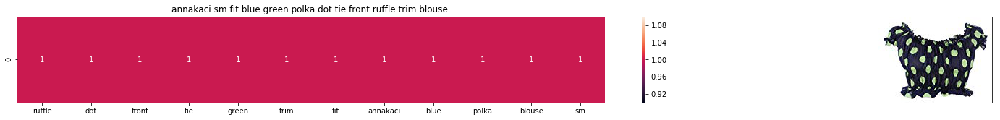

ASIN : B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean similarity with the query image : 0.0


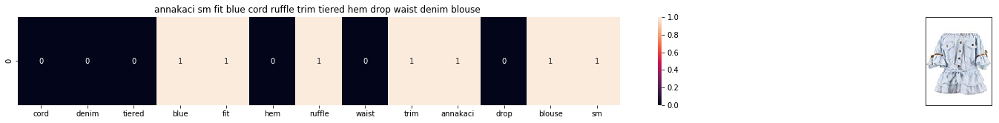

ASIN : B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean similarity with the query image : 3.31662479036


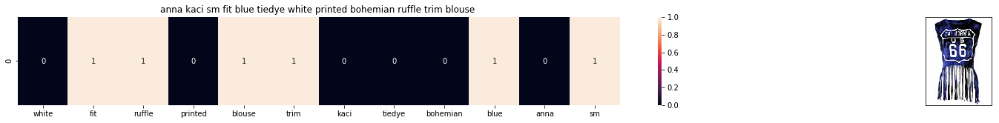

ASIN : B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean similarity with the query image : 3.46410161514


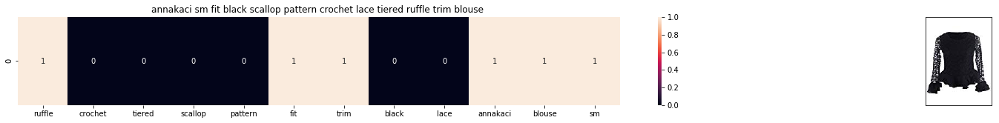

ASIN : B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean similarity with the query image : 3.46410161514


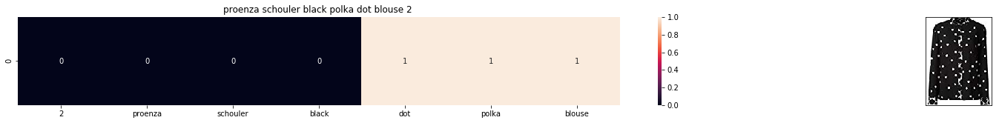

ASIN : B074TLHLMN
Brand: Proenza Schouler
Title: proenza schouler black polka dot blouse 2 
Euclidean similarity with the query image : 3.46410161514


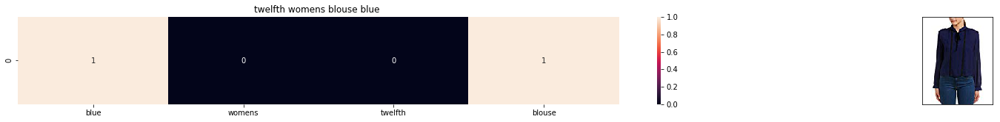

ASIN : B074F5BP5F
Brand: On Twelfth
Title: twelfth womens blouse blue 
Euclidean similarity with the query image : 3.46410161514


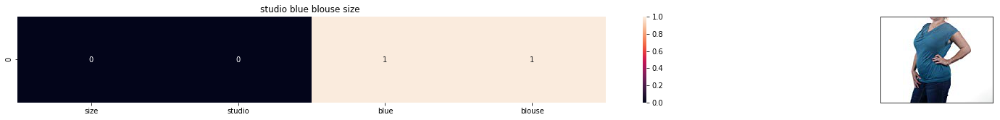

ASIN : B016P80OKQ
Brand: Studio M
Title: studio blue blouse size 
Euclidean similarity with the query image : 3.46410161514


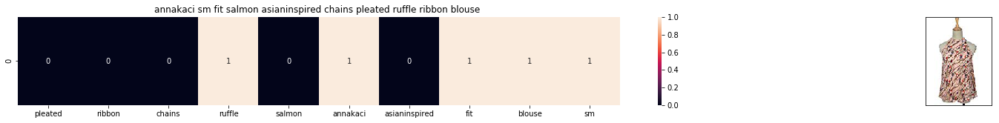

ASIN : B007KSG42S
Brand: Anna-Kaci
Title: annakaci sm fit salmon asianinspired chains pleated ruffle ribbon blouse 
Euclidean similarity with the query image : 3.46410161514


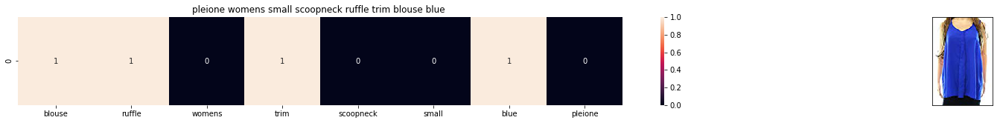

ASIN : B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean similarity with the query image : 3.46410161514


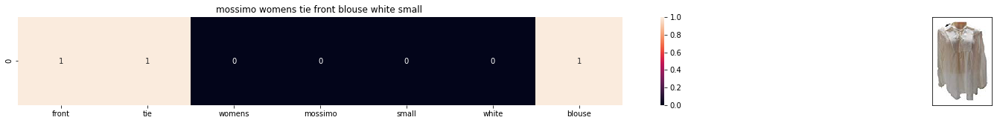

ASIN : B07111HHX6
Brand: Mossimo
Title: mossimo womens tie front blouse white small 
Euclidean similarity with the query image : 3.60555127546


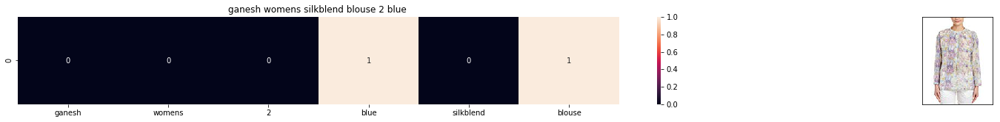

ASIN : B01N3SAT1F
Brand: Ganesh
Title: ganesh womens silkblend blouse 2 blue 
Euclidean similarity with the query image : 3.60555127546


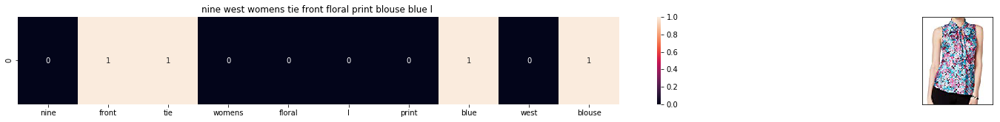

ASIN : B06WW5C6NJ
Brand: Nine West
Title: nine west womens tie front floral print blouse blue l 
Euclidean similarity with the query image : 3.60555127546


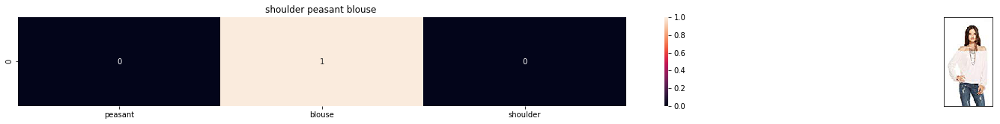

ASIN : B01E1QD5PK
Brand: CHASER
Title: shoulder peasant blouse 
Euclidean similarity with the query image : 3.60555127546


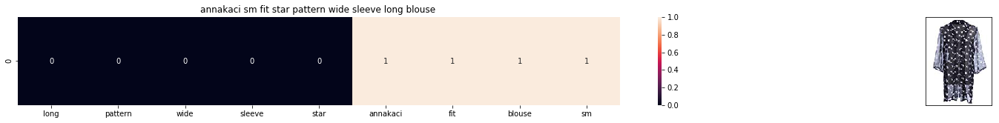

ASIN : B00G5RYY18
Brand: Anna-Kaci
Title: annakaci sm fit star pattern wide sleeve long blouse 
Euclidean similarity with the query image : 3.60555127546


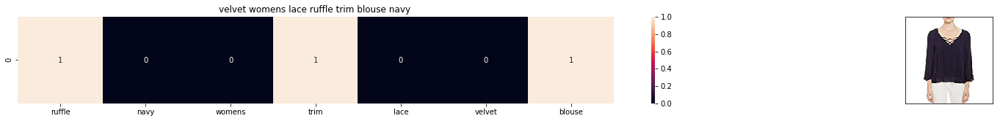

ASIN : B06XCZGQLP
Brand: Velvet by Graham & Spencer
Title: velvet womens lace ruffle trim blouse navy 
Euclidean similarity with the query image : 3.60555127546


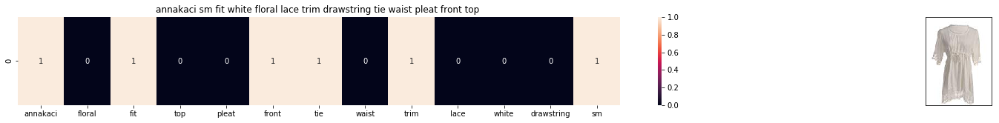

ASIN : B00DW1NKSS
Brand: Anna-Kaci
Title: annakaci sm fit white floral lace trim drawstring tie waist pleat front top 
Euclidean similarity with the query image : 3.60555127546


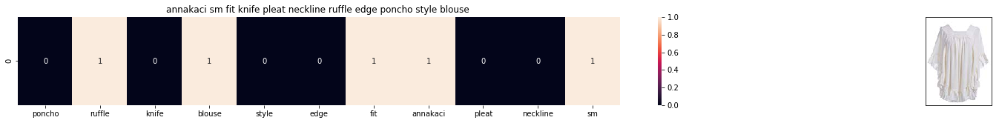

ASIN : B00HCNNOJW
Brand: Anna-Kaci
Title: annakaci sm fit knife pleat neckline ruffle edge poncho style blouse 
Euclidean similarity with the query image : 3.60555127546


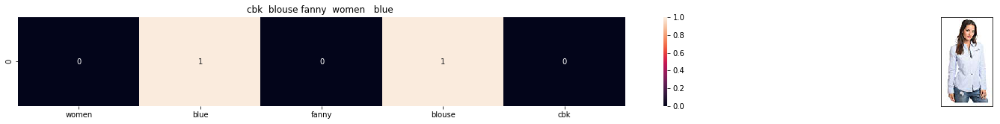

ASIN : B071NDX99J
Brand: CBK
Title: cbk  blouse fanny  women   blue 
Euclidean similarity with the query image : 3.60555127546


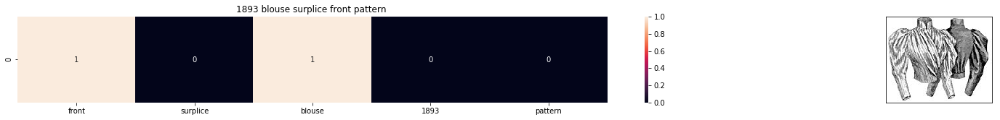

ASIN : B00886YXL0
Brand: Ageless Patterns
Title: 1893 blouse surplice front pattern 
Euclidean similarity with the query image : 3.60555127546


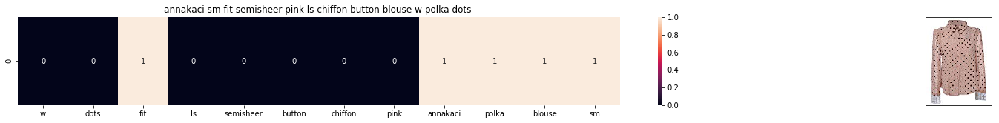

ASIN : B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean similarity with the query image : 3.60555127546


In [43]:
def bag_of_words_model(doc_id, num_results):
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

bag_of_words_model(931, 20) 

# TF-IDF Based product similarity

In [44]:
tfidf_title_vectorizer=TfidfVectorizer(min_df=0)
tfidf_title_features=tfidf_title_vectorizer.fit_transform(data['title'])

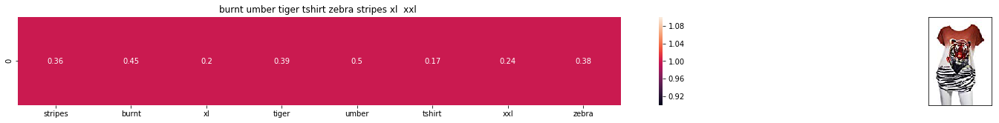

ASIN : B00JXQB5FQ
BRAND : Si Row
Eucliden distance from the given image : 0.0


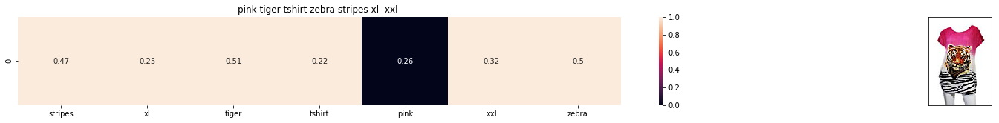

ASIN : B00JXQASS6
BRAND : Si Row
Eucliden distance from the given image : 0.753633191245


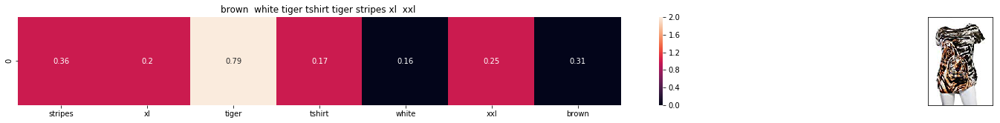

ASIN : B00JXQCWTO
BRAND : Si Row
Eucliden distance from the given image : 0.935764394377


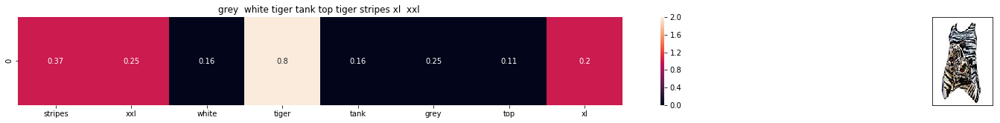

ASIN : B00JXQAFZ2
BRAND : Si Row
Eucliden distance from the given image : 0.95861535242


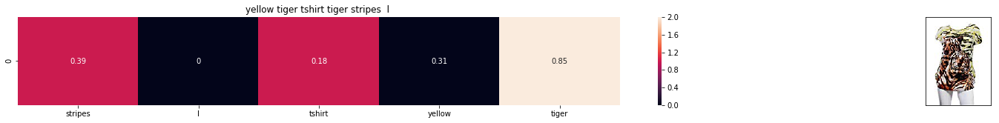

ASIN : B00JXQCUIC
BRAND : Si Row
Eucliden distance from the given image : 1.00007496145


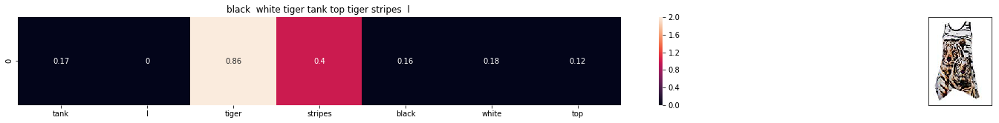

ASIN : B00JXQAO94
BRAND : Si Row
Eucliden distance from the given image : 1.02321555246


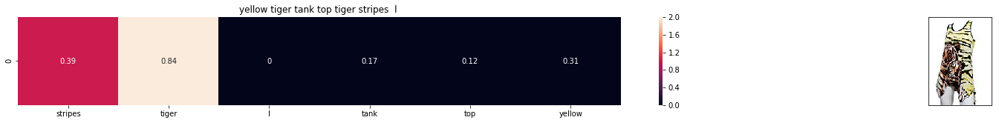

ASIN : B00JXQAUWA
BRAND : Si Row
Eucliden distance from the given image : 1.0319918463


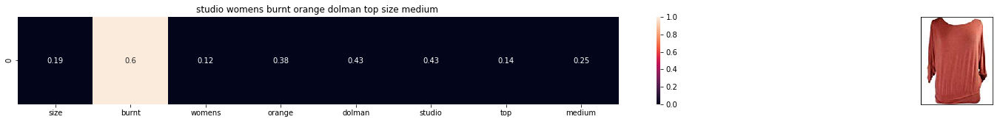

ASIN : B06XSCVFT5
BRAND : Studio M
Eucliden distance from the given image : 1.21068436704


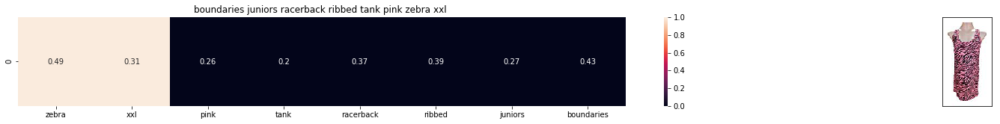

ASIN : B06Y2GTYPM
BRAND : No Boundaries
Eucliden distance from the given image : 1.21216838107


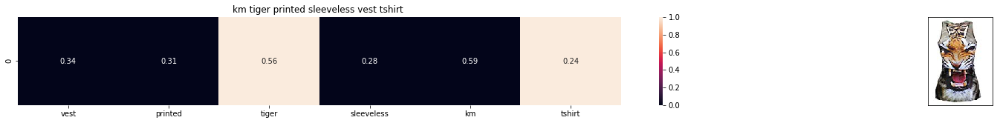

ASIN : B012VQLT6Y
BRAND : KM T-shirt
Eucliden distance from the given image : 1.21979064028


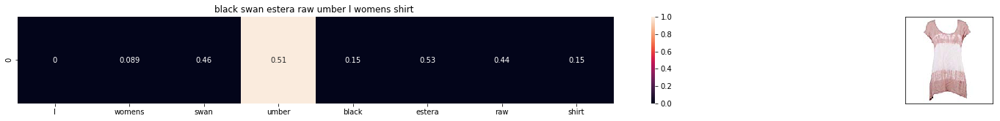

ASIN : B06Y1VN8WQ
BRAND : Black Swan
Eucliden distance from the given image : 1.220684966


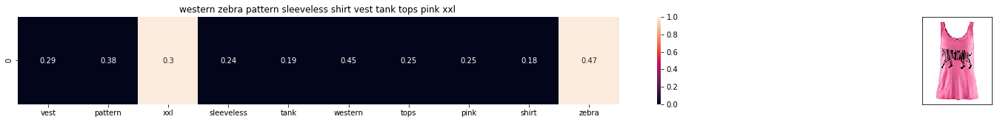

ASIN : B00Z6HEXWI
BRAND : Black Temptation
Eucliden distance from the given image : 1.22128139212


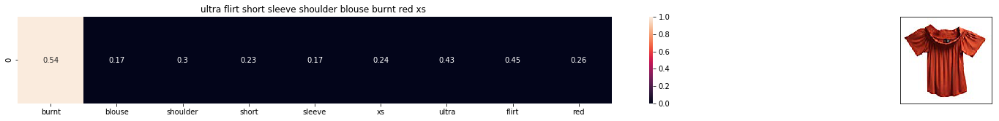

ASIN : B074TR12BH
BRAND : Ultra Flirt
Eucliden distance from the given image : 1.23133640946


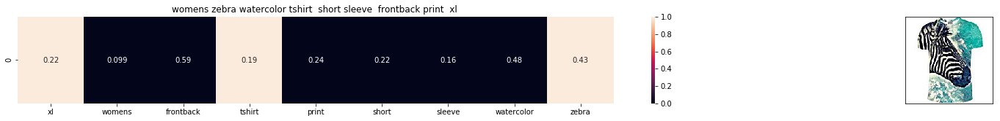

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
Eucliden distance from the given image : 1.23184519726


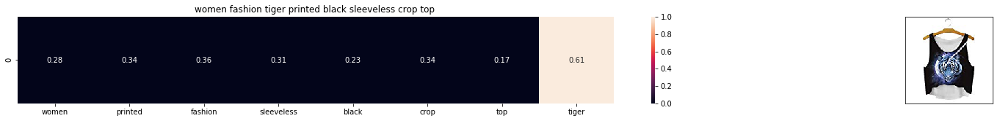

ASIN : B074T8ZYGX
BRAND : MKP Crop Top
Eucliden distance from the given image : 1.23406074574


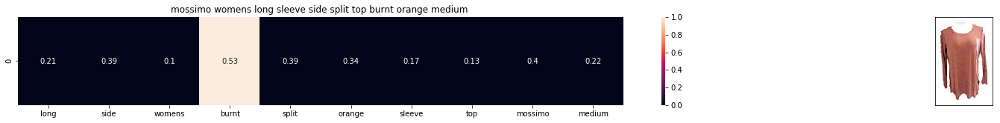

ASIN : B071ZDF6T2
BRAND : Mossimo
Eucliden distance from the given image : 1.23527855777


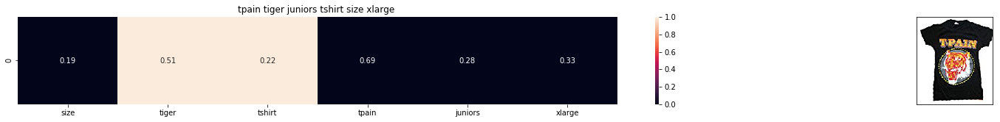

ASIN : B01K0H02OG
BRAND : Tultex
Eucliden distance from the given image : 1.23645729881


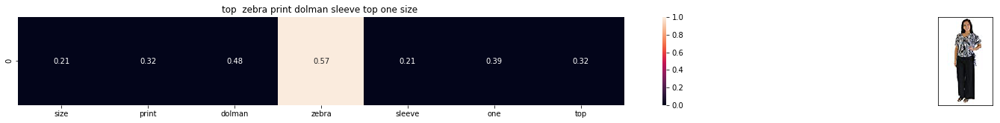

ASIN : B00H8A6ZLI
BRAND : Vivian's Fashions
Eucliden distance from the given image : 1.24996155053


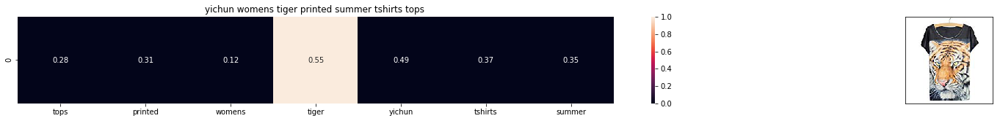

ASIN : B010NN9RXO
BRAND : YICHUN
Eucliden distance from the given image : 1.25354614209


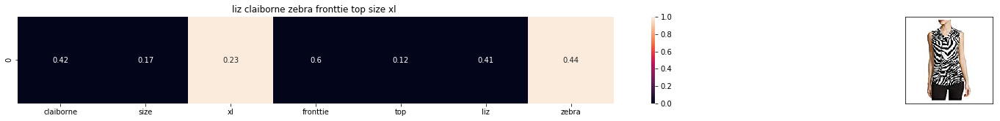

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
Eucliden distance from the given image : 1.25388329384


In [45]:
def tfidf_model(doc_id,num_results):
    pairwise_dist=pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])
    indices=np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists=np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(12566, 20)

# IDF Based similarity 

In [46]:
idf_title_vectorizer=CountVectorizer()
idf_title_features=idf_title_vectorizer.fit_transform(data['title'])

In [47]:
def n_containing(word):
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    return math.log(data.shape[0]/(n_containing(word)))

In [48]:
idf_title_features=idf_title_features.astype(np.float)

In [49]:
for i in idf_title_vectorizer.vocabulary_.keys():
    idf_val=idf(i)
    for j in idf_title_features[:,idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val

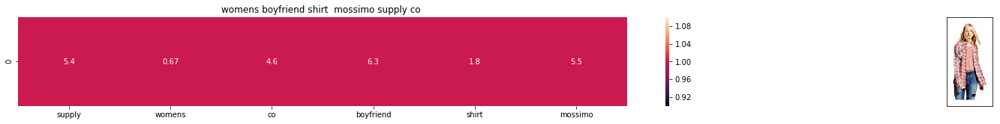

ASIN : B0711KNM5Y
Brand : Mossimo
euclidean distance from the given image : 0.0


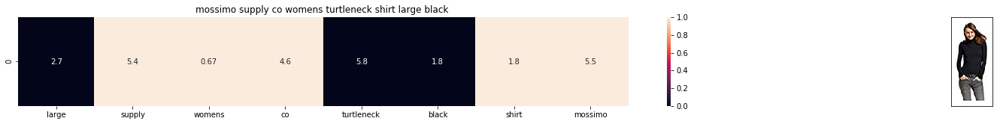

ASIN : B071VLTMFT
Brand : Mossimo Supply Co
euclidean distance from the given image : 9.1153310047


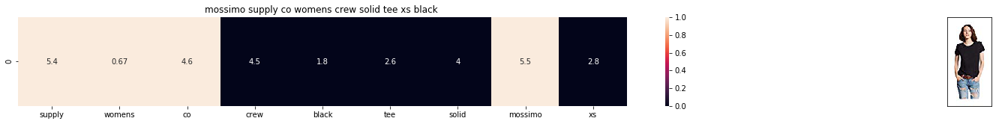

ASIN : B071DDK73M
Brand : Mossimo Supply Co
euclidean distance from the given image : 9.82026724959


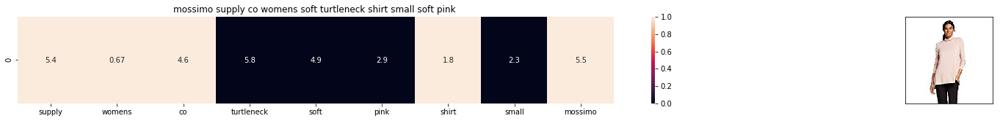

ASIN : B071YSN9YY
Brand : Mossimo Supply Co
euclidean distance from the given image : 10.5048241446


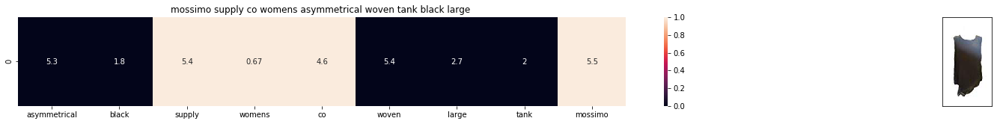

ASIN : B071YSHDG5
Brand : Mossimo
euclidean distance from the given image : 10.6680656115


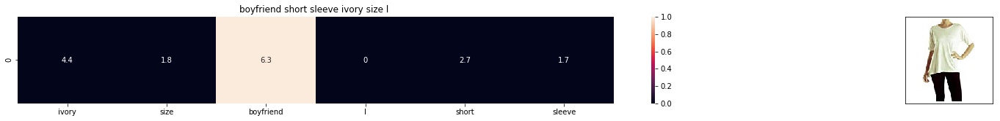

ASIN : B01M32GI6B
Brand : Azules
euclidean distance from the given image : 10.8024667081


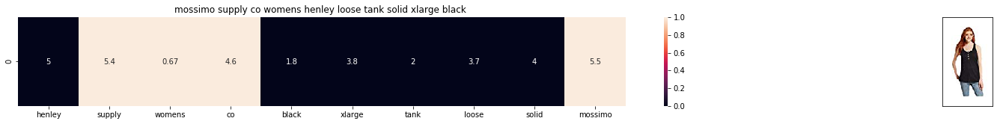

ASIN : B071Y5KY3P
Brand : Mossimo Supply Co
euclidean distance from the given image : 10.93063298


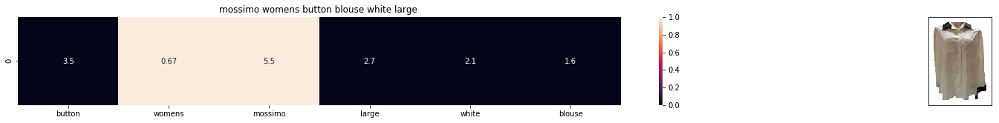

ASIN : B071YGYXQC
Brand : Mossimo
euclidean distance from the given image : 10.9382226199


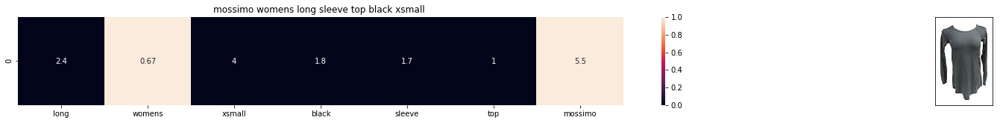

ASIN : B07173L752
Brand : Mossimo
euclidean distance from the given image : 11.0627312007


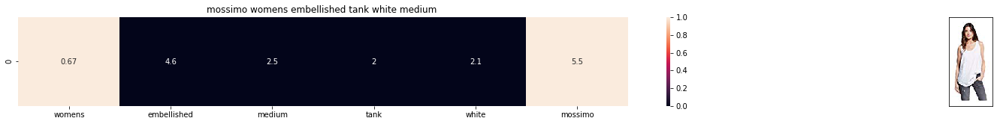

ASIN : B071DH39DL
Brand : Mossimo
euclidean distance from the given image : 11.3699609811


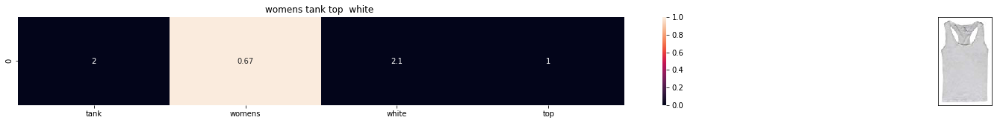

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 11.5132887687


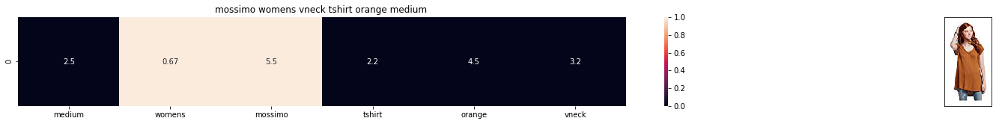

ASIN : B07145F1VR
Brand : Mossimo Supply Co
euclidean distance from the given image : 11.6381092704


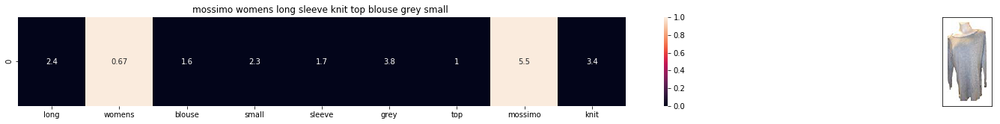

ASIN : B071LTQV1R
Brand : Mossimo
euclidean distance from the given image : 11.7104195565


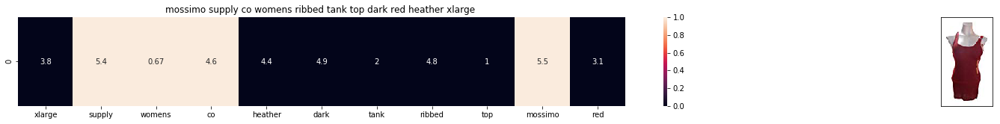

ASIN : B07174G5N5
Brand : Mossimo Supply Co
euclidean distance from the given image : 11.7664582797


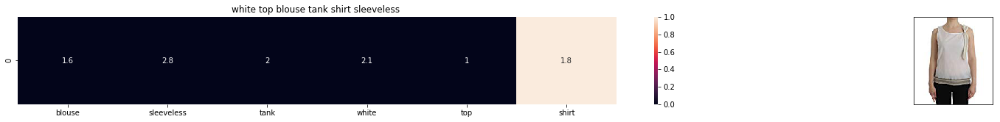

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 11.8417689184


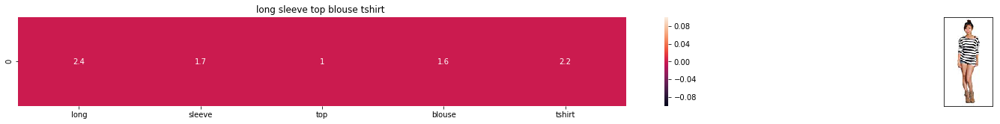

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 11.876227631


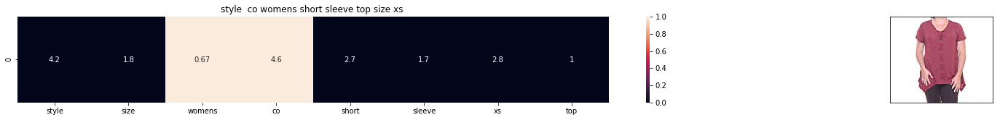

ASIN : B07356R7NY
Brand : Styleco
euclidean distance from the given image : 11.9202201373


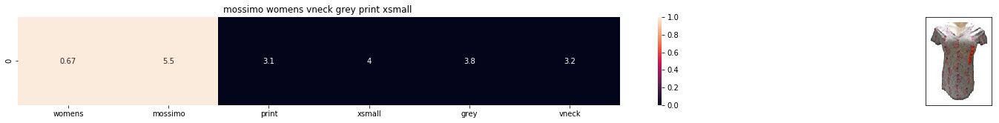

ASIN : B071R3MLRV
Brand : Mossimo
euclidean distance from the given image : 11.9715683138


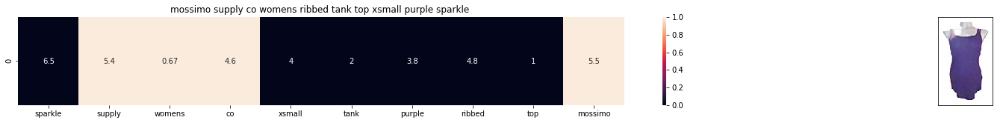

ASIN : B072824NSJ
Brand : Mossimo Supply Co
euclidean distance from the given image : 11.9787924262


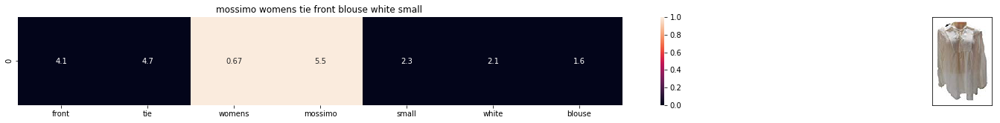

ASIN : B07111HHX6
Brand : Mossimo
euclidean distance from the given image : 12.0303209507


In [50]:
def idf_model(doc_id,num_results):
    pairwise_dist=pairwise_distances(idf_title_features,idf_title_features[doc_id])
    indices=np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists=np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices=list(data.index[indices])
    
    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]],data['medium_image_url'].loc[df_indices[i]],'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)
idf_model(12577,20)        

# Text Semantic Based Product similarity

In [52]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

In [53]:
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

In [54]:
def get_word_vec(sentence,doc_id,m_name):
    vec=[]
    for i in sentence.split():
        if i in vocab:
            if m_name=='weighted' and i in idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id,idf_title_vectorizer.vocabulary_[i]]*model[i])
            elif m_name=='avg':
                vec.append(model[i])
        else:
            vec.append(np.zeros(shape=(300,)))
    return np.array(vec) 


def get_distance(vec1,vec2):
    final_dist = []
    for i in vec1:
        dist=[]
        for j in vec2:
            dist.append(np.linalg.norm(i - j))
        final_dist.append(np.array(dist))
    return np.array(final_dist)

def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    
    
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    s2_vec = get_word_vec(sentence2, doc_id2, model)
    s1_s2_dist = get_distance(s1_vec, s2_vec)


    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [55]:
vocab=model.keys()
def build_avg_vec(sentence,num_feature,doc_id,m_name):
    featureVec=np.zeros((num_feature,),dtype="float32")
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

# Average word2vec Product similarity

In [56]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)

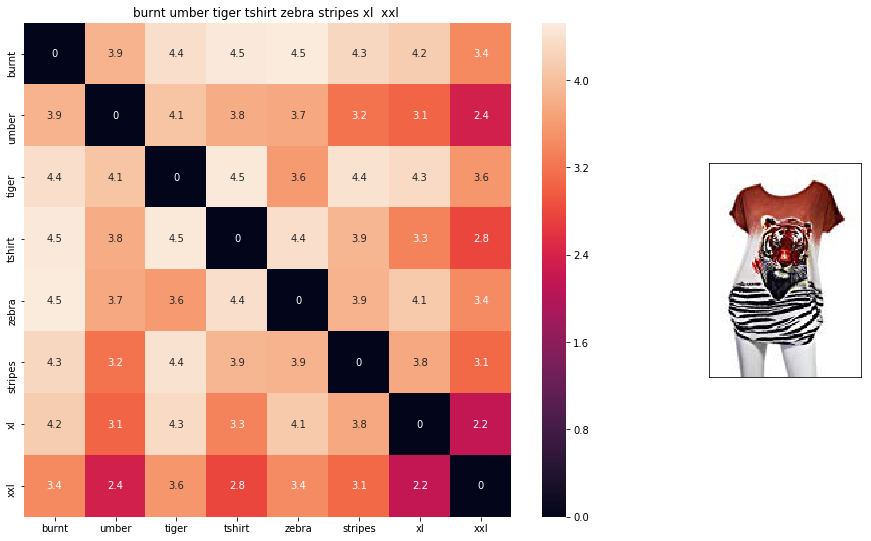

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.000690534


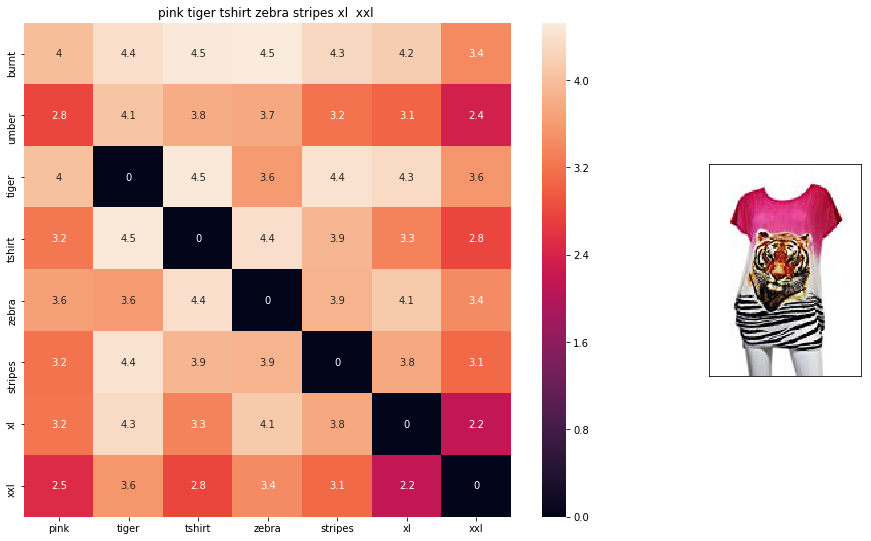

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 0.589193


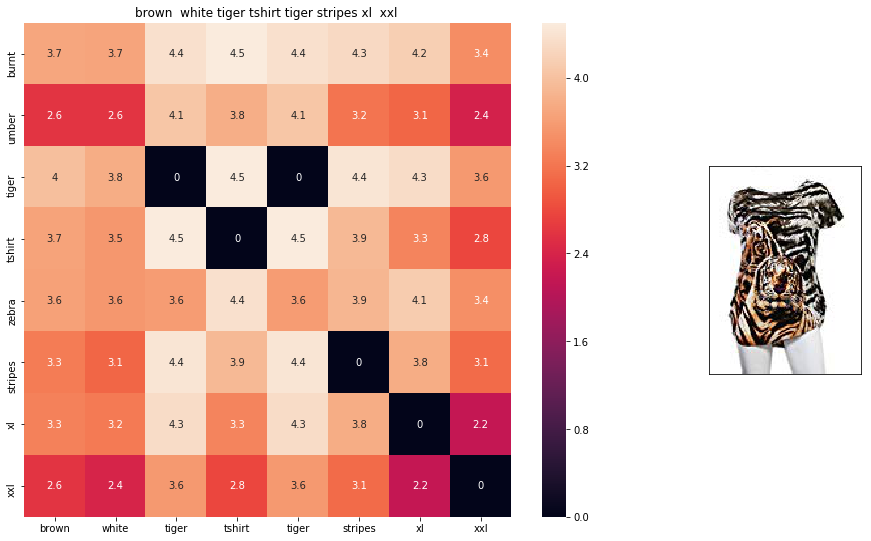

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 0.700344


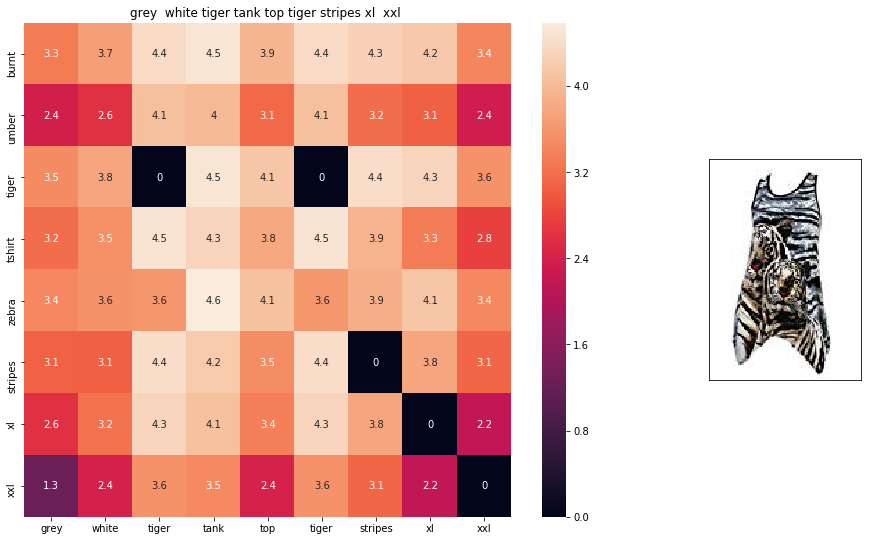

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 0.89284


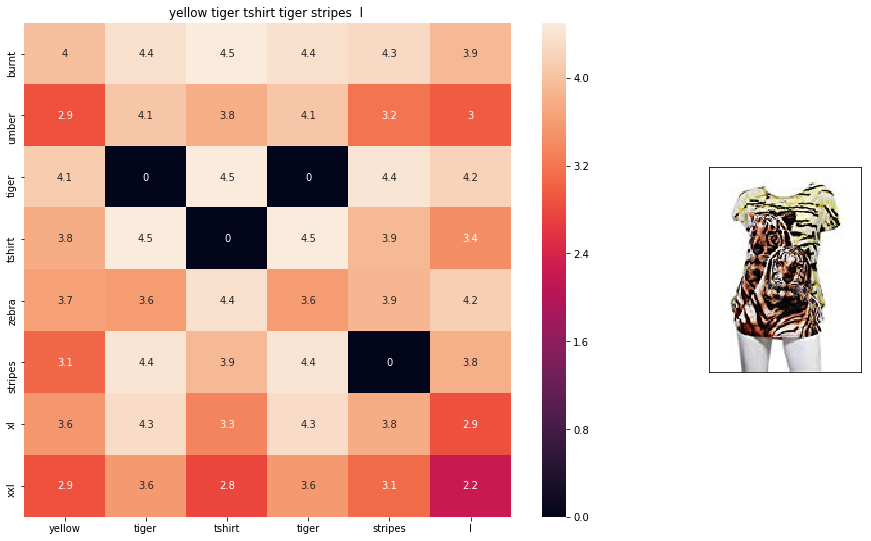

ASIN : B00JXQCUIC
BRAND : Si Row
euclidean distance from given input image : 0.956013


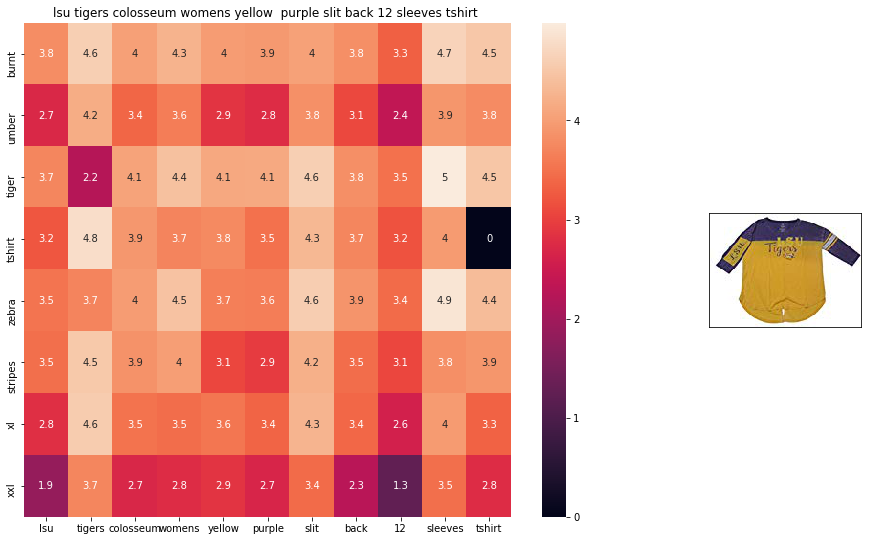

ASIN : B073R5Q8HD
BRAND : Colosseum
euclidean distance from given input image : 1.02297


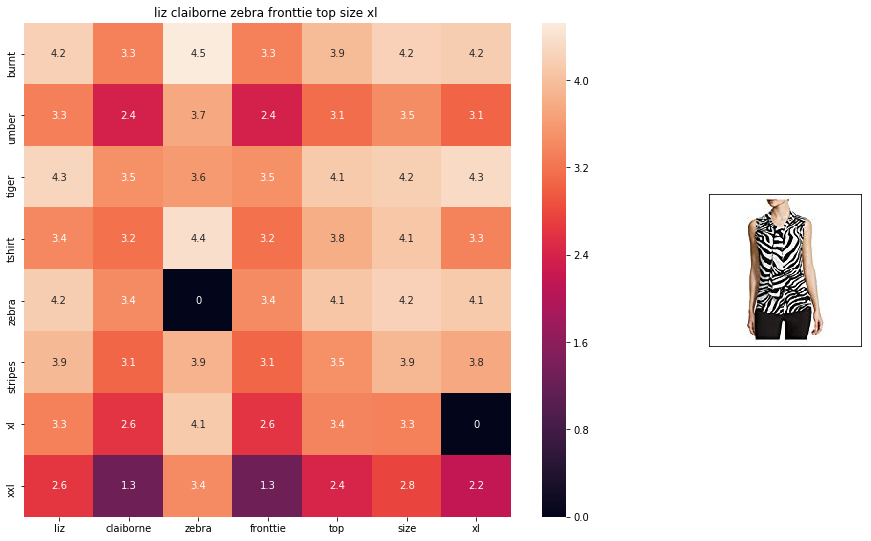

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
euclidean distance from given input image : 1.06693


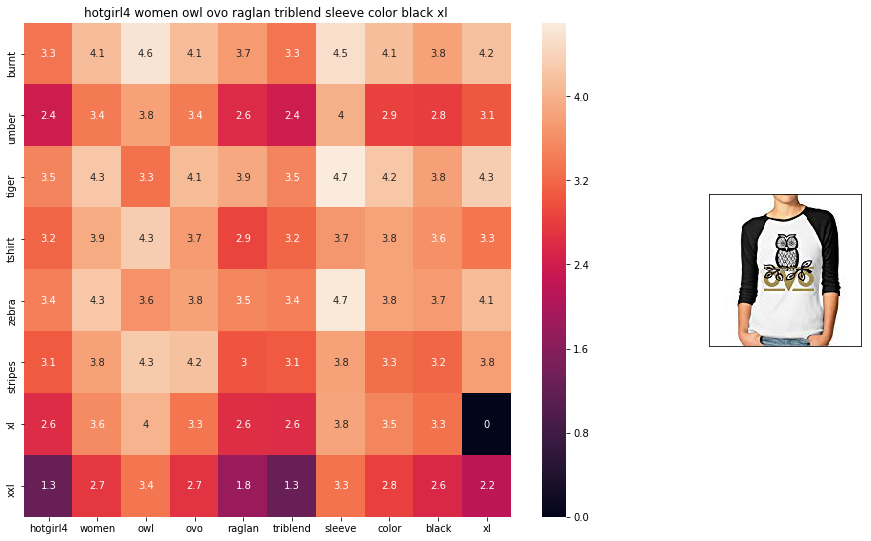

ASIN : B01L8L73M2
BRAND : Hotgirl4 Raglan Design
euclidean distance from given input image : 1.07314


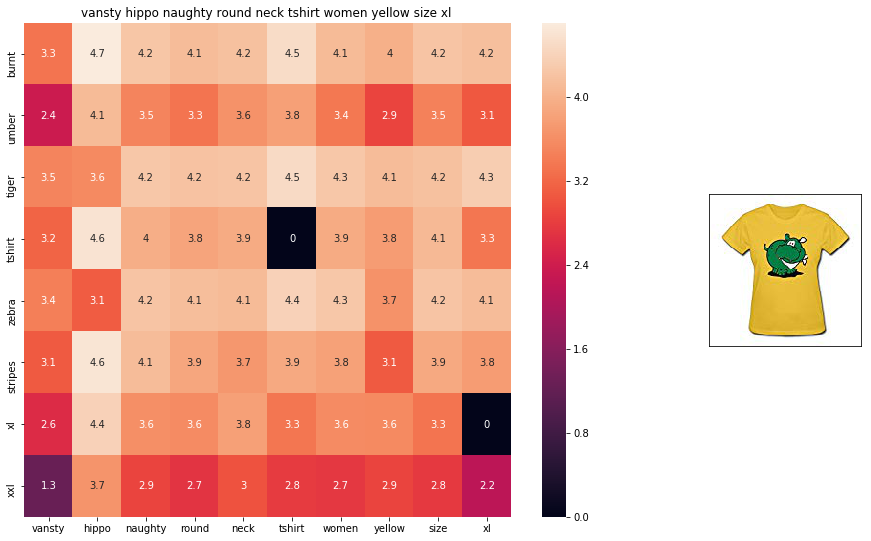

ASIN : B01EJS5H06
BRAND : Vansty
euclidean distance from given input image : 1.07572


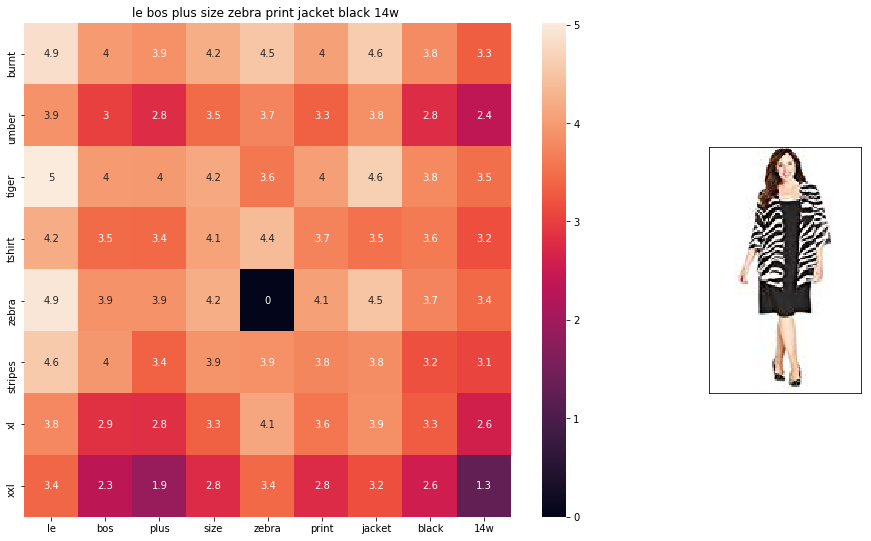

ASIN : B01BO1XRK8
BRAND : Le Bos
euclidean distance from given input image : 1.084


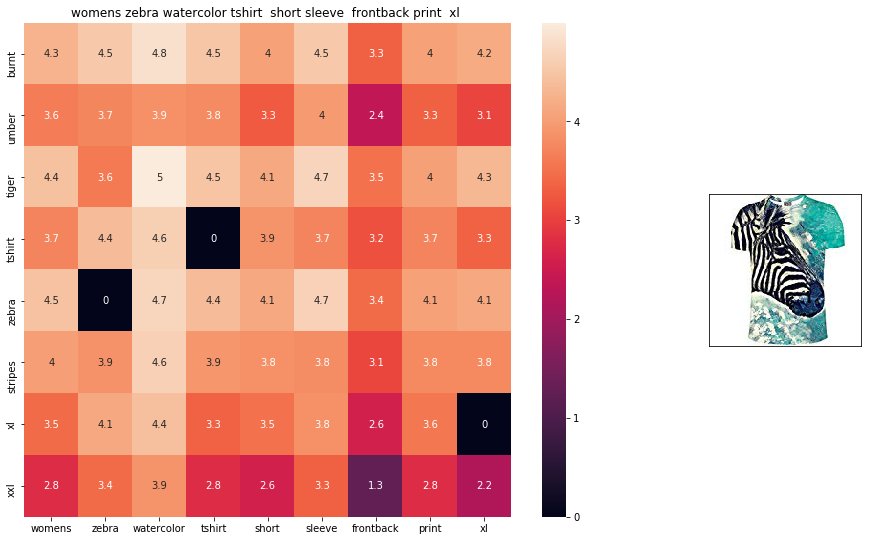

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
euclidean distance from given input image : 1.08422


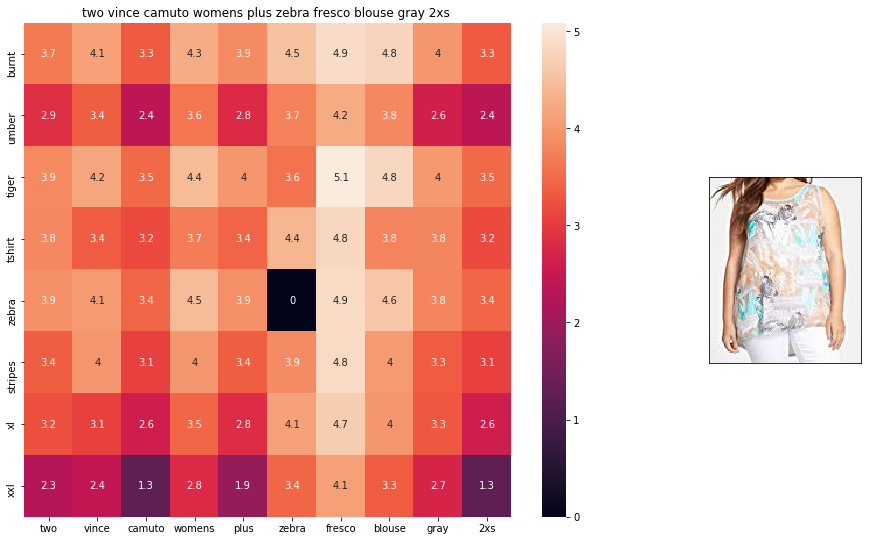

ASIN : B074MJRGW6
BRAND : Two by Vince Camuto
euclidean distance from given input image : 1.0895


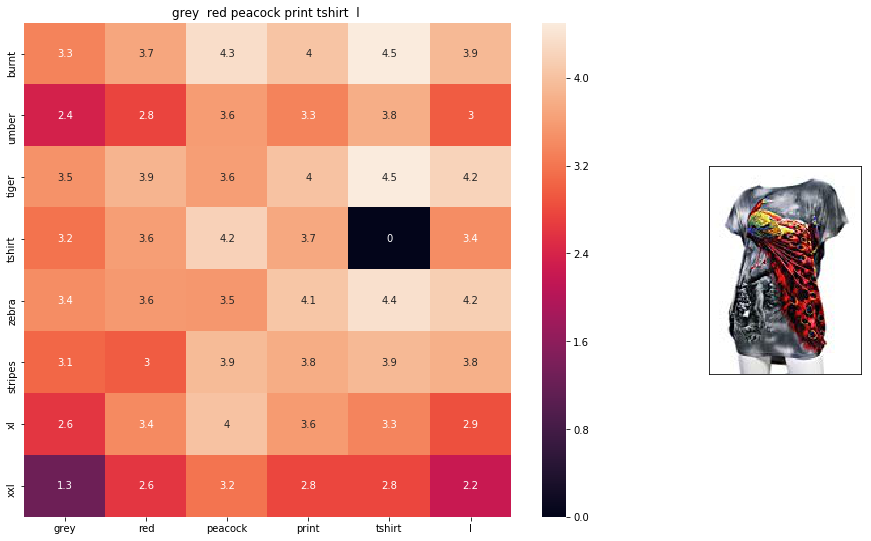

ASIN : B00JXQCFRS
BRAND : Si Row
euclidean distance from given input image : 1.09006


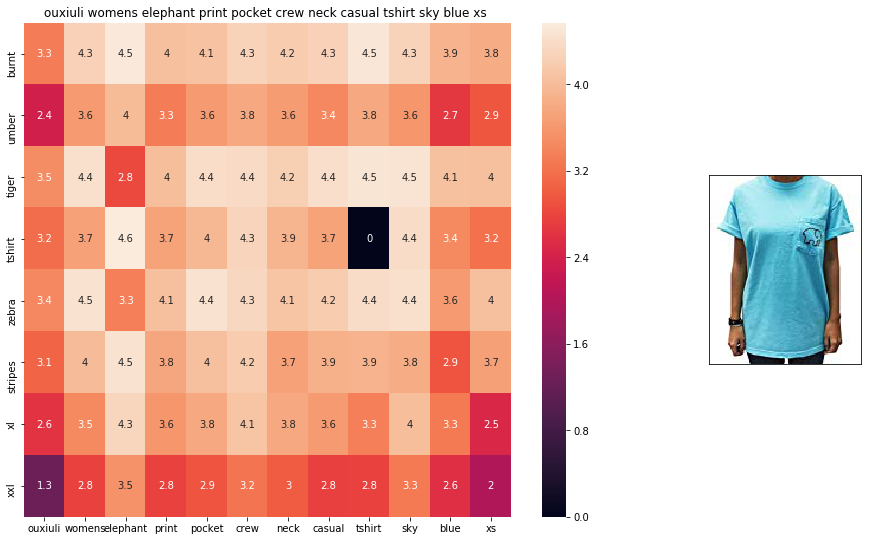

ASIN : B01I53HU6K
BRAND : ouxiuli
euclidean distance from given input image : 1.09201


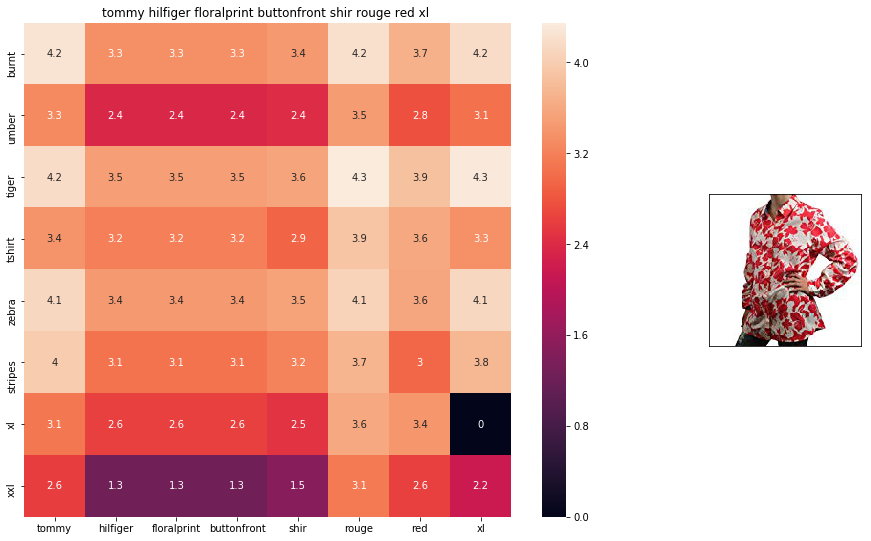

ASIN : B0711NGTQM
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.09234


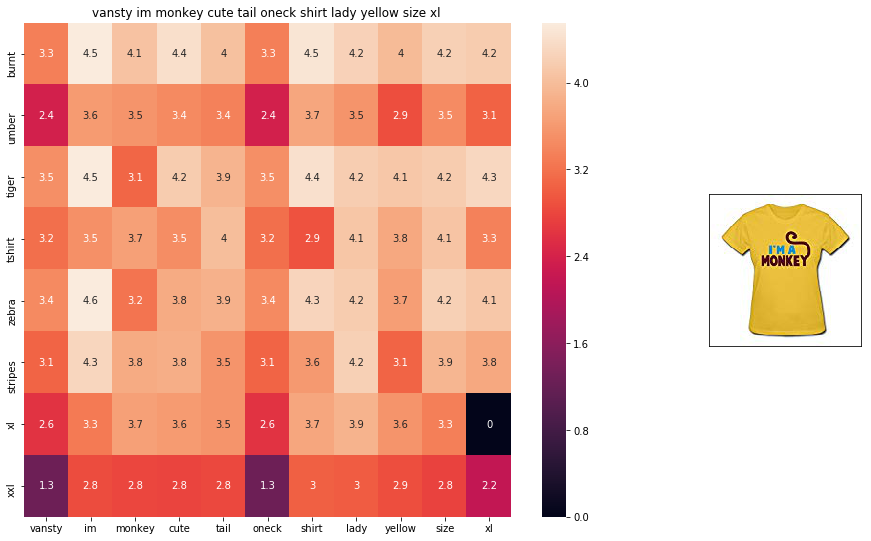

ASIN : B01EFSLO8Y
BRAND : Vansty
euclidean distance from given input image : 1.0934


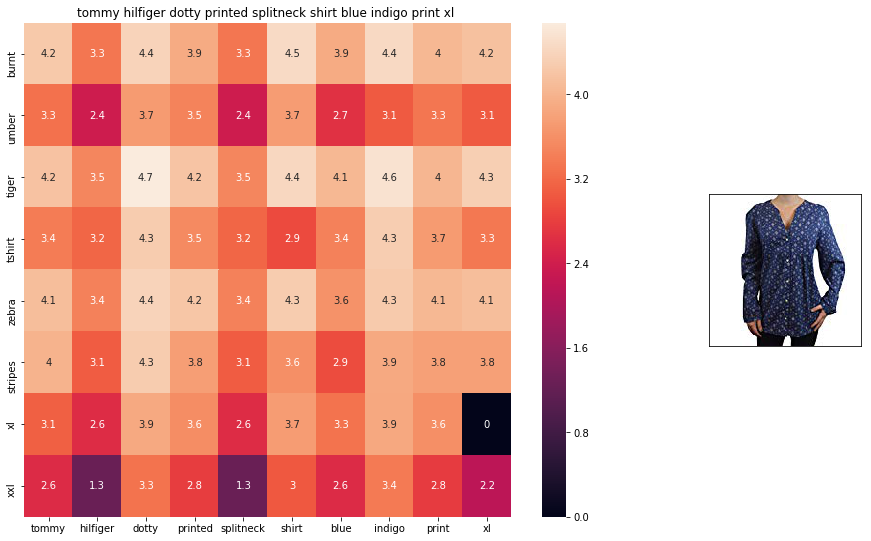

ASIN : B0716TVWQ4
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0942


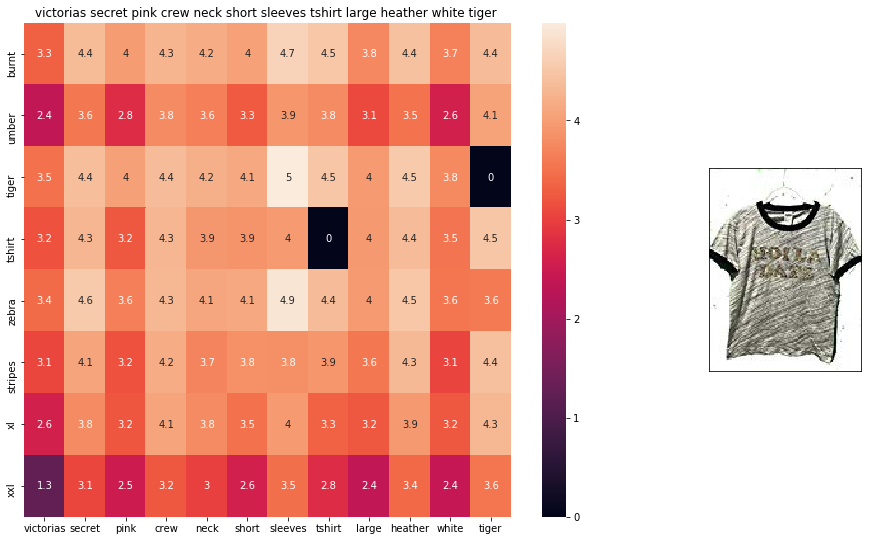

ASIN : B0716MVPGV
BRAND : V.Secret
euclidean distance from given input image : 1.09483


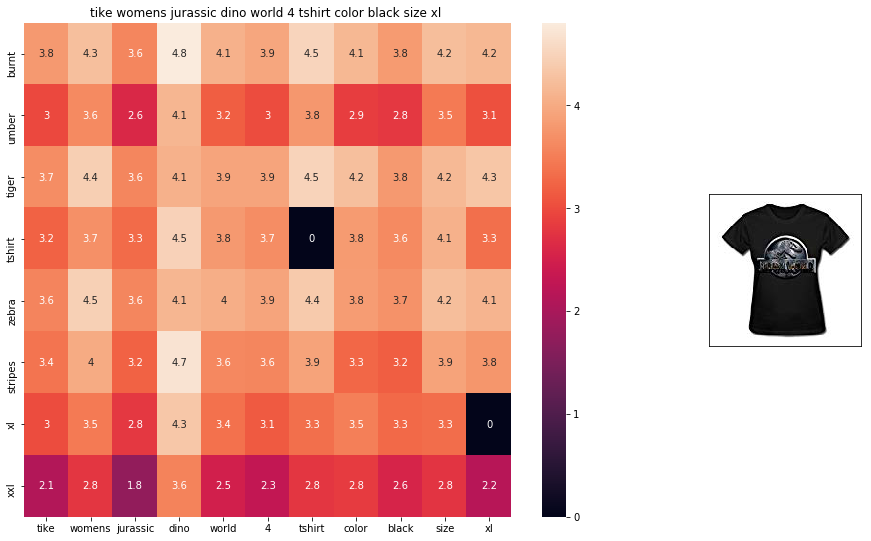

ASIN : B016OPN4OI
BRAND : TIKE Fashions
euclidean distance from given input image : 1.09513


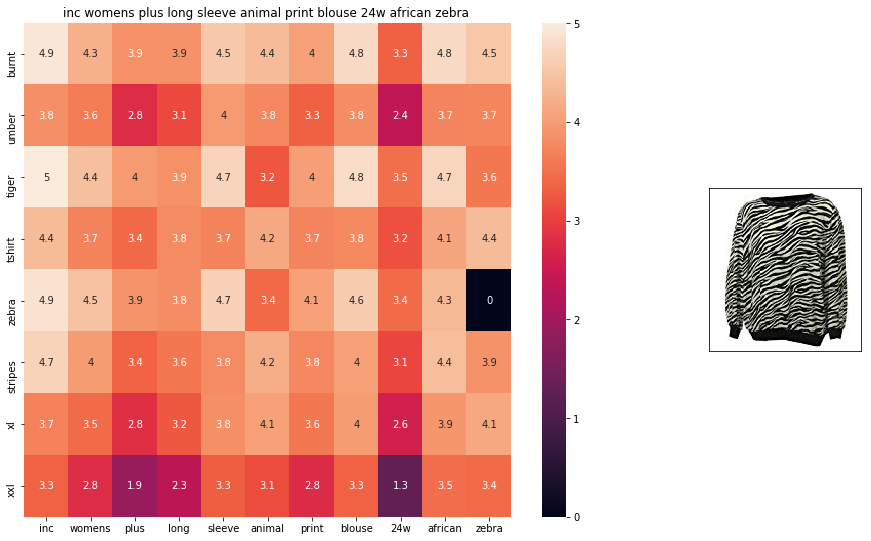

ASIN : B018WDJCUA
BRAND : INC - International Concepts Woman
euclidean distance from given input image : 1.09669


In [57]:
def avg_w2v_model(doc_id, num_results):

    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

# Idf Weighted word2vec for product similarity

In [58]:
doc_id = 0
w2v_title_weight = []
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
w2v_title_weight = np.array(w2v_title_weight)

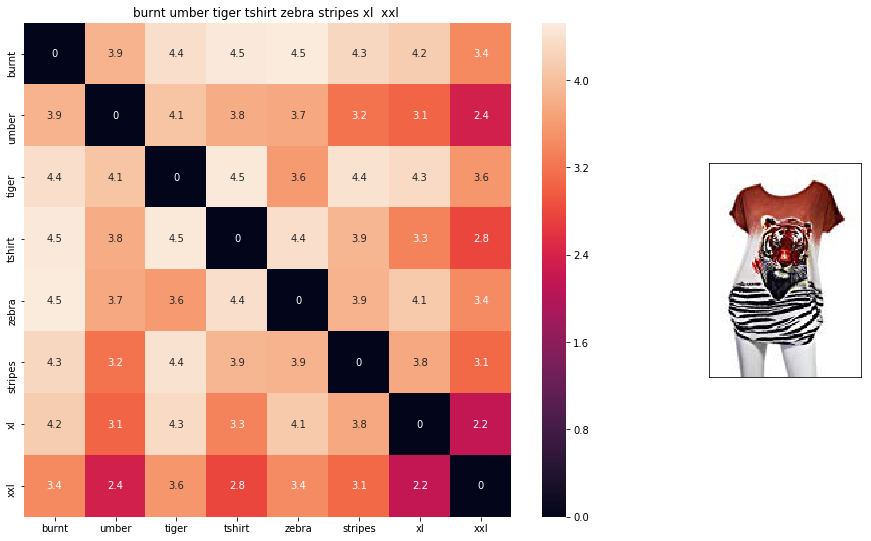

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.00390625


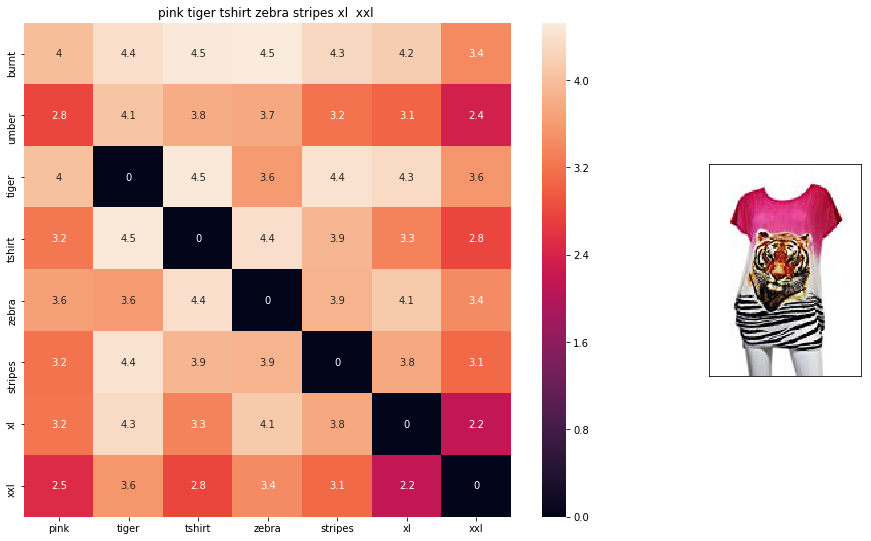

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 4.06389


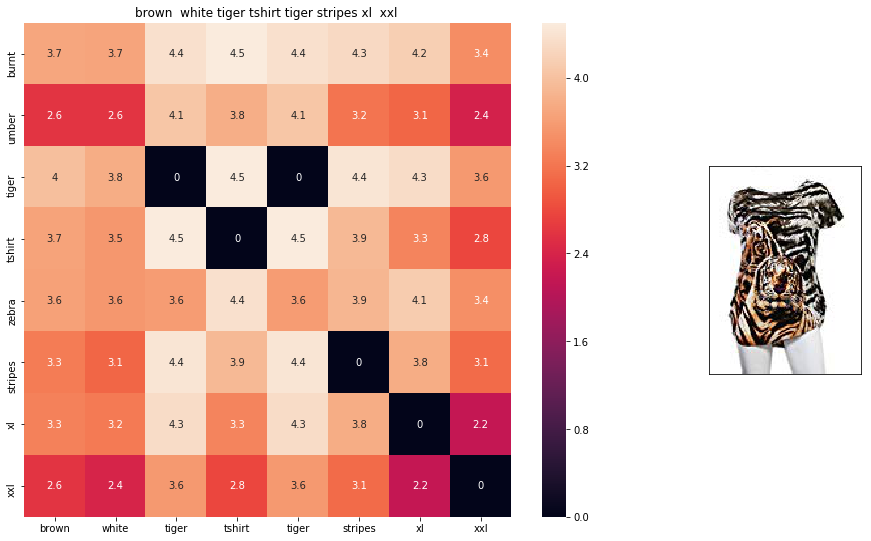

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 4.77094


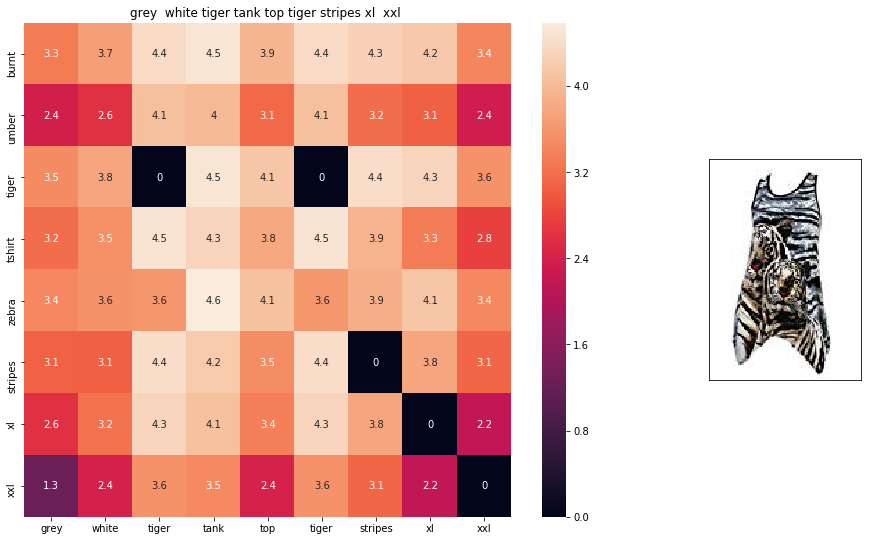

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 5.36016


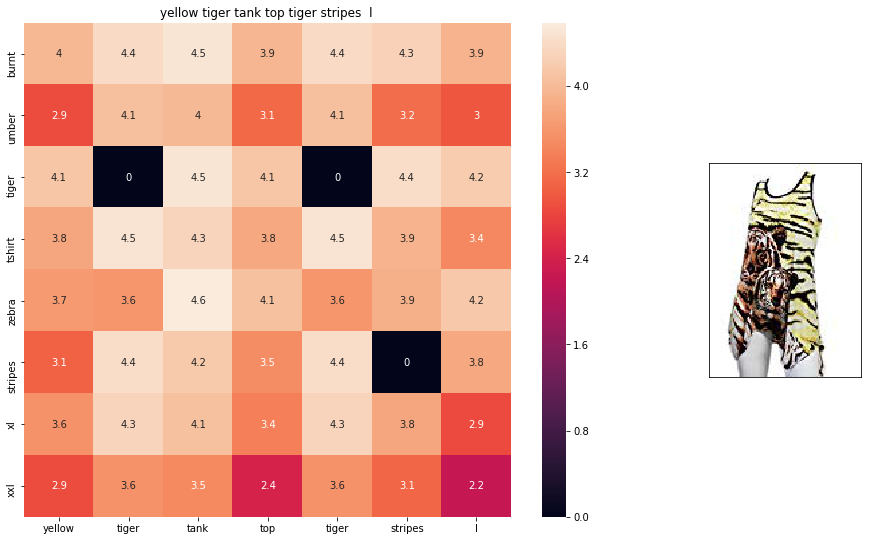

ASIN : B00JXQAUWA
BRAND : Si Row
euclidean distance from given input image : 5.68952


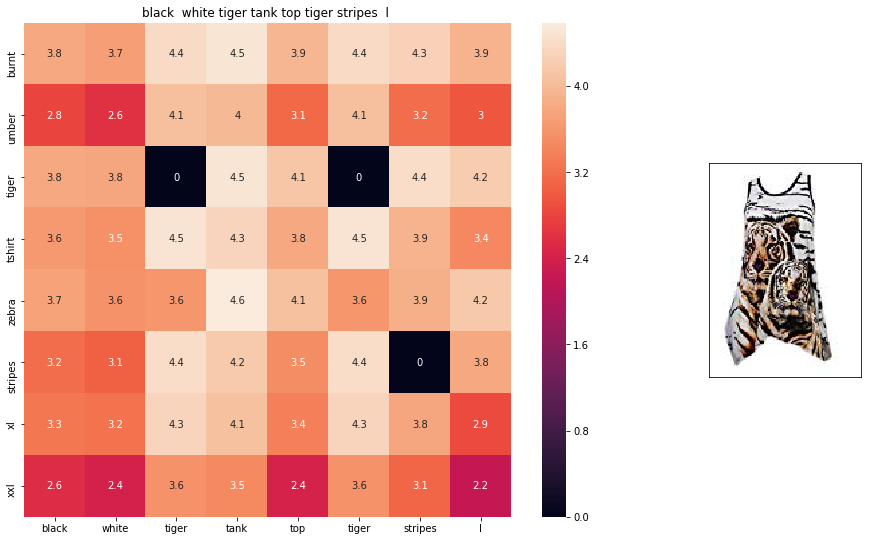

ASIN : B00JXQAO94
BRAND : Si Row
euclidean distance from given input image : 5.69302


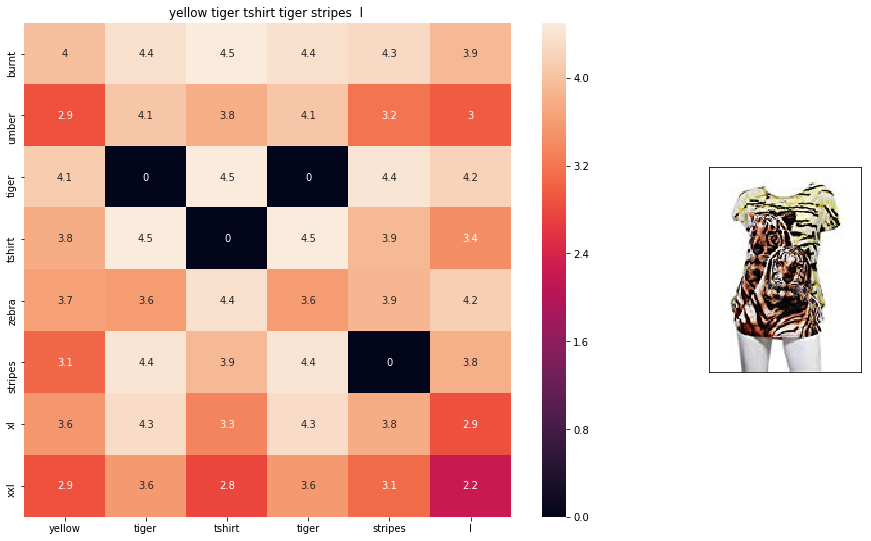

ASIN : B00JXQCUIC
BRAND : Si Row
euclidean distance from given input image : 5.89344


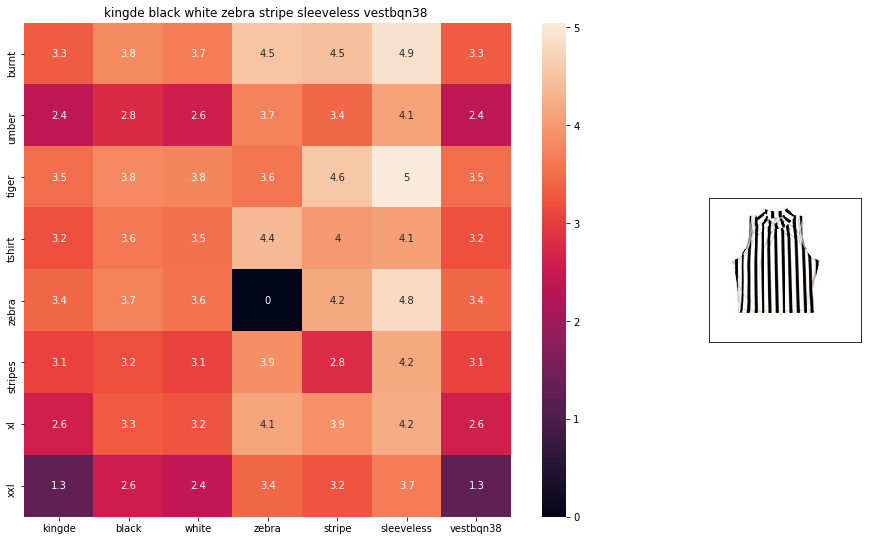

ASIN : B015H41F6G
BRAND : KINGDE
euclidean distance from given input image : 6.13299


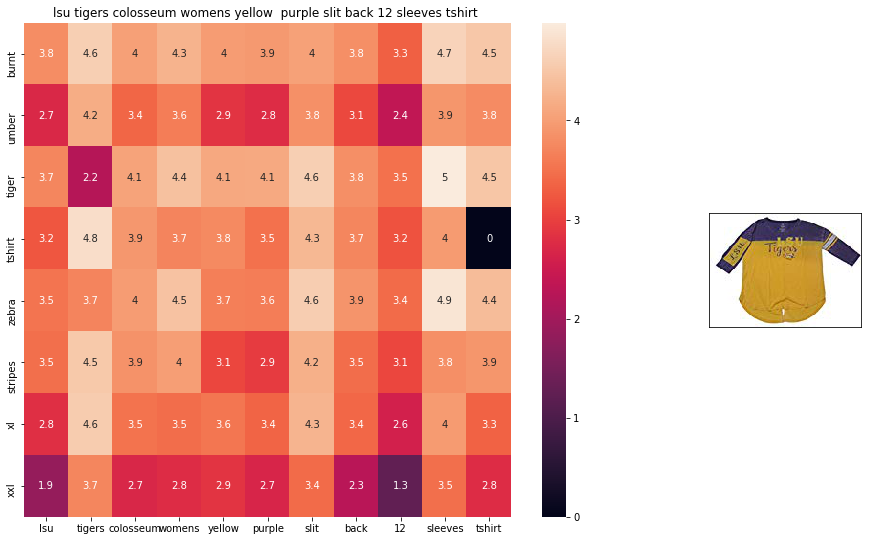

ASIN : B073R5Q8HD
BRAND : Colosseum
euclidean distance from given input image : 6.25671


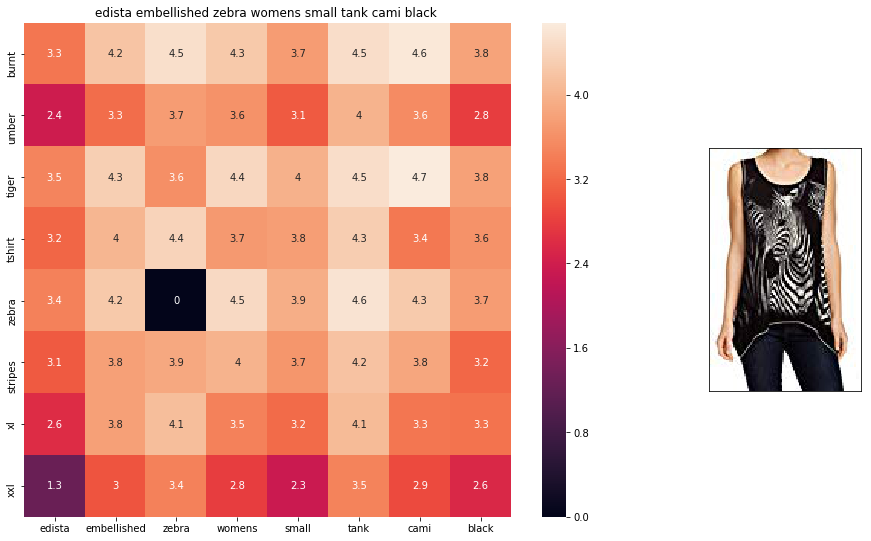

ASIN : B074P8MD22
BRAND : Edista
euclidean distance from given input image : 6.3922


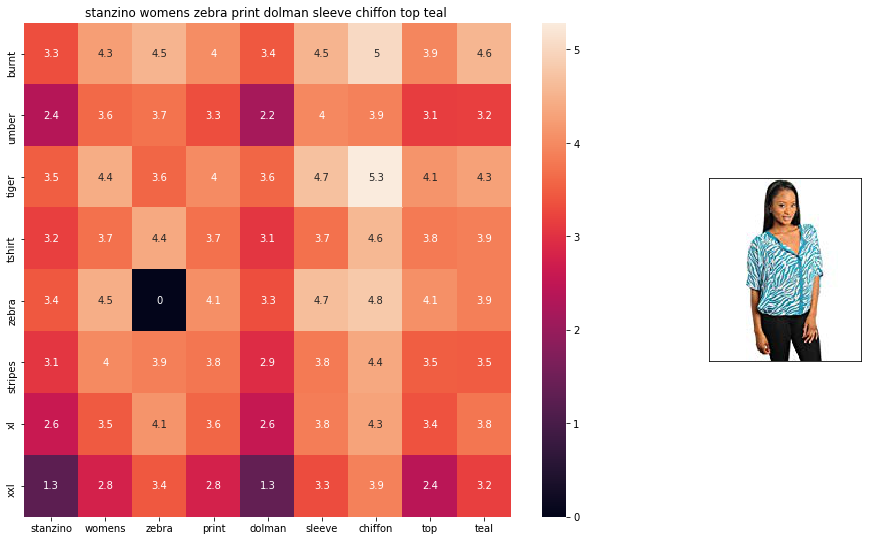

ASIN : B00C0I3U3E
BRAND : Stanzino
euclidean distance from given input image : 6.4149


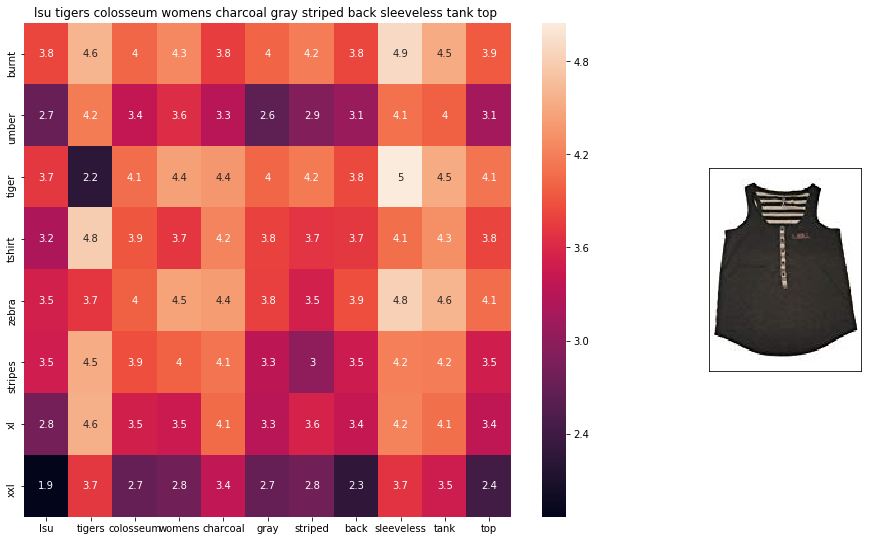

ASIN : B073R4ZM7Y
BRAND : Colosseum
euclidean distance from given input image : 6.45096


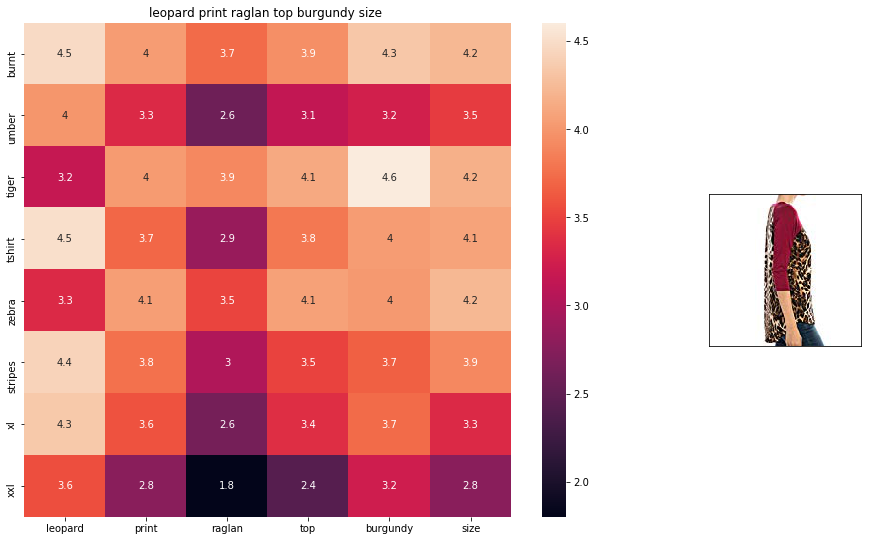

ASIN : B01C6ORLDQ
BRAND : 1 Mad Fit
euclidean distance from given input image : 6.46341


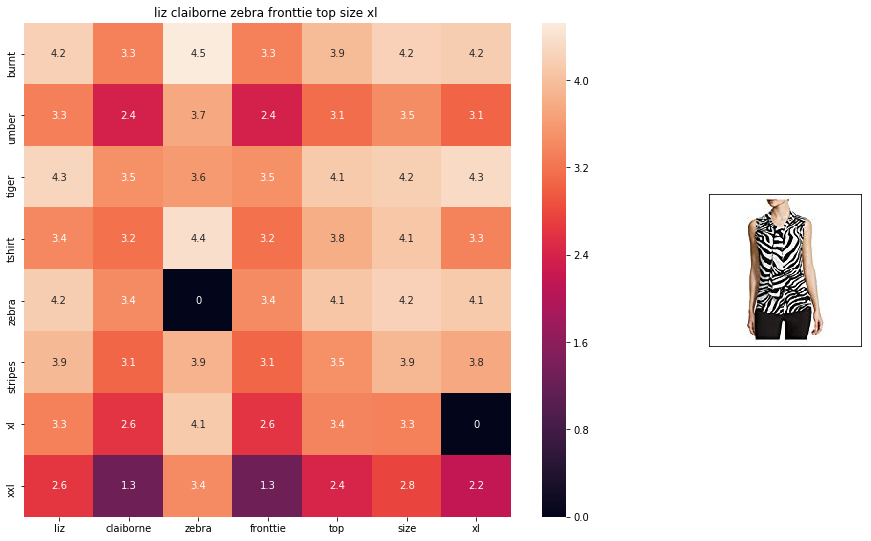

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
euclidean distance from given input image : 6.53922


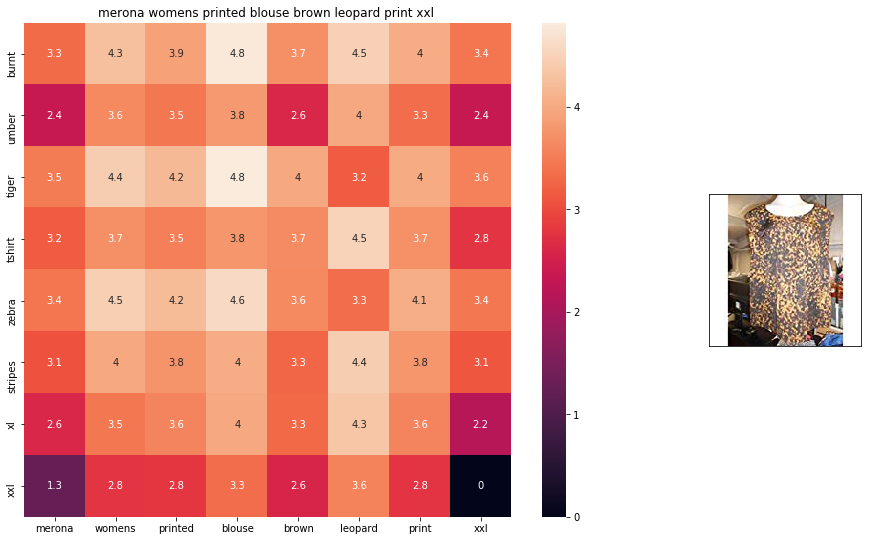

ASIN : B071YF3WDD
BRAND : Merona
euclidean distance from given input image : 6.5755


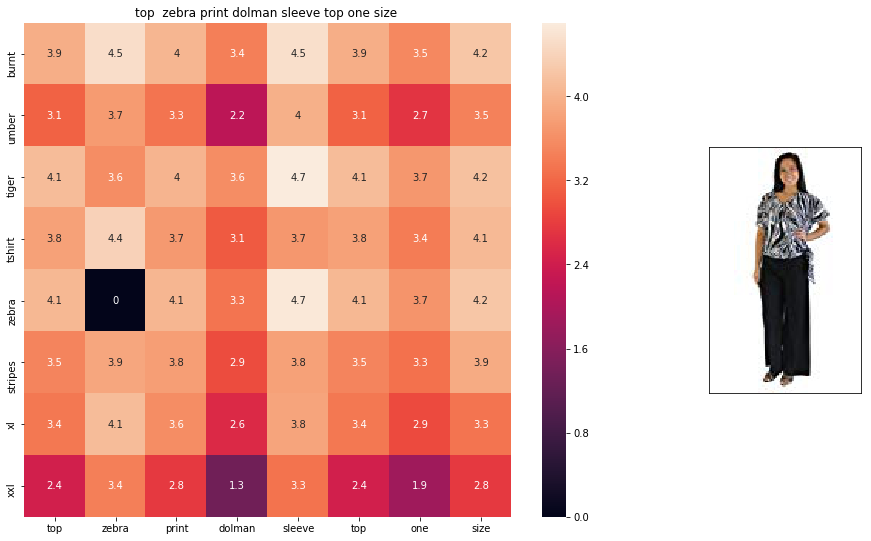

ASIN : B00H8A6ZLI
BRAND : Vivian's Fashions
euclidean distance from given input image : 6.63822


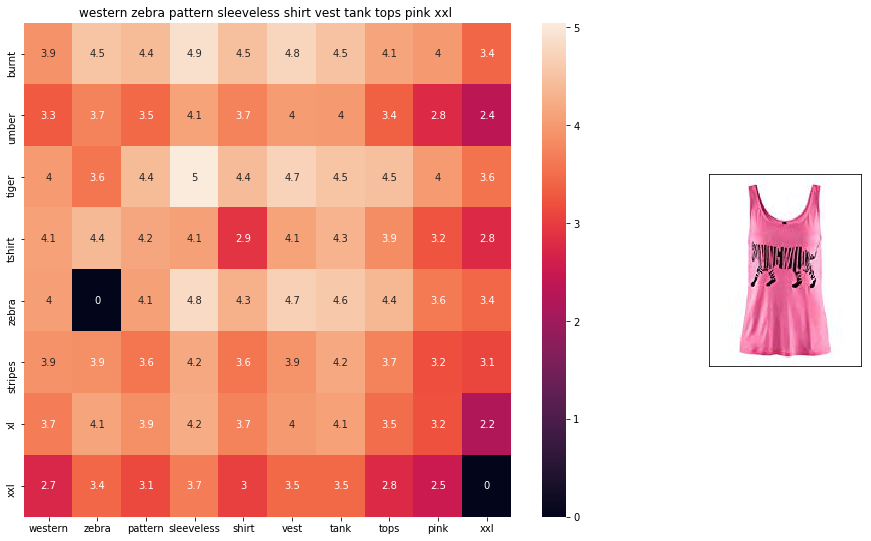

ASIN : B00Z6HEXWI
BRAND : Black Temptation
euclidean distance from given input image : 6.66074


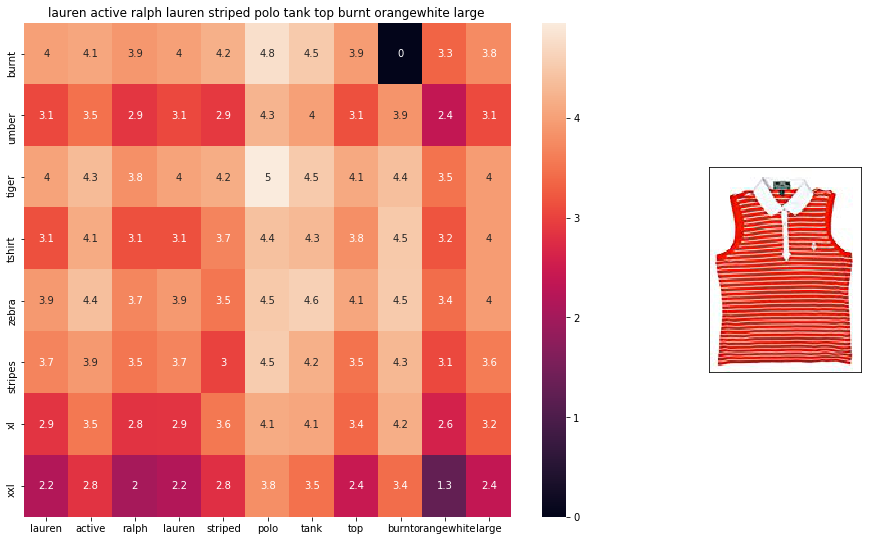

ASIN : B00ILGH5OY
BRAND : Ralph Lauren Active
euclidean distance from given input image : 6.68391


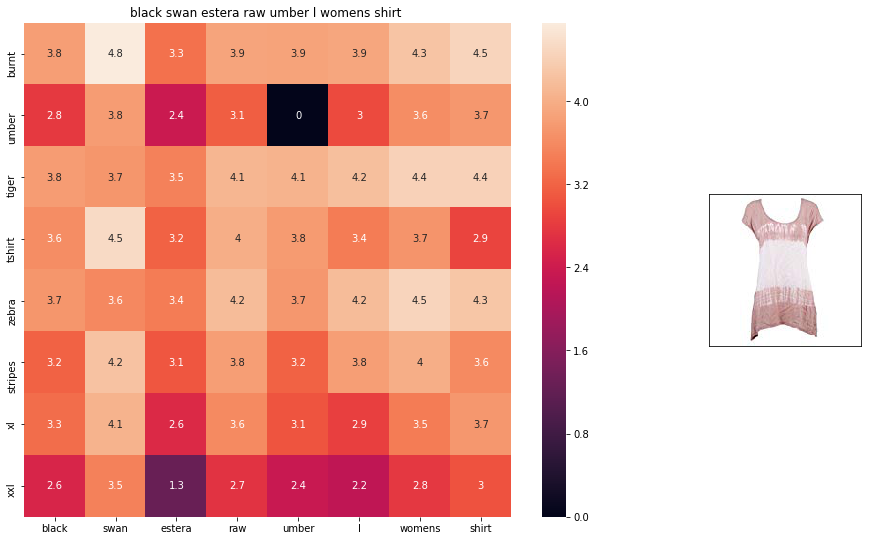

ASIN : B06Y1VN8WQ
BRAND : Black Swan
euclidean distance from given input image : 6.70576


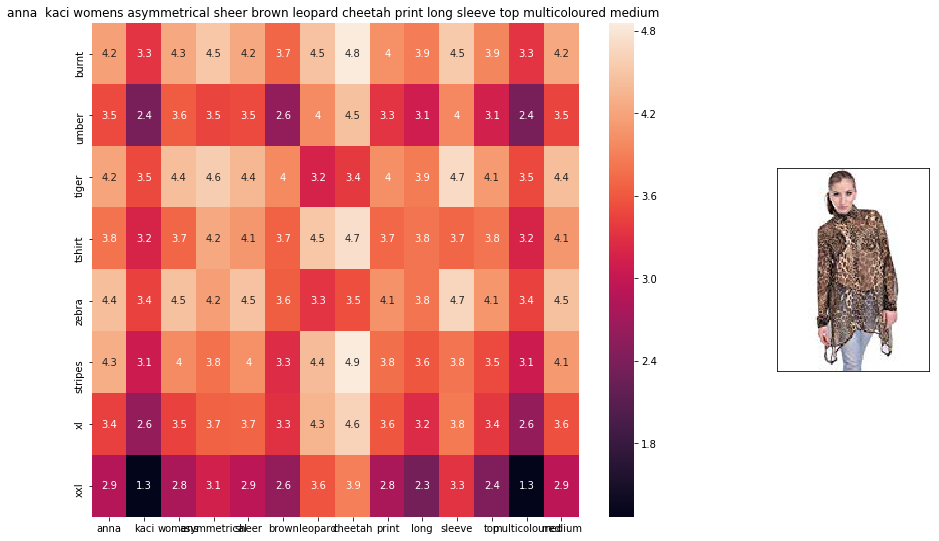

ASIN : B00KSNTY7Y
BRAND : Anna-Kaci
euclidean distance from given input image : 6.70612


In [59]:
def weighted_w2v_model(doc_id, num_results):

    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
weighted_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

# Weighted similarity using Brand and Color

In [64]:
data['brand'].fillna(value='Not Given',inplace=True)
brand = [x.replace(" ","_") for x in data['brand'].values]
types=  [x.replace(" ","_") for x in data['product_type_name'].values]
colors=[x.replace(" ","_") for x in data['color'].values]

brand_vectorizer=CountVectorizer()
brand_features=brand_vectorizer.fit_transform(brand)

type_vectorizer=CountVectorizer()
types_features=type_vectorizer.fit_transform(types)

color_vectorizer=CountVectorizer()
color_features=color_vectorizer.fit_transform(colors)

extra_features=hstack((brand_features,types_features,color_features)).tocsr()

In [75]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    s2_vec = get_word_vec(sentance2, doc_id2, model) 
    
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brand[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brand[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

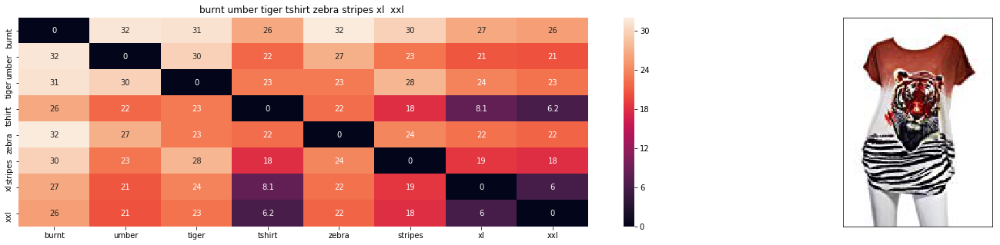

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.001953125


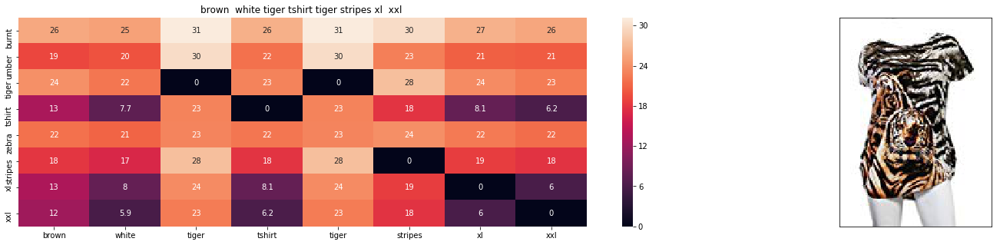

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.38547115326


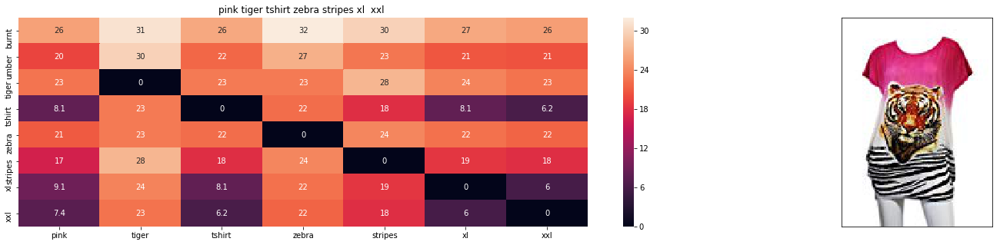

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 2.73905105609


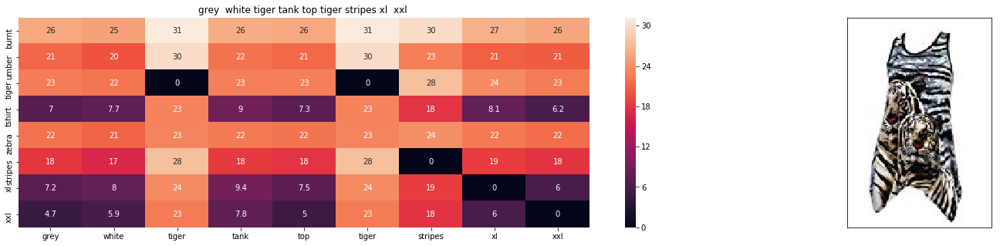

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 3.387187195


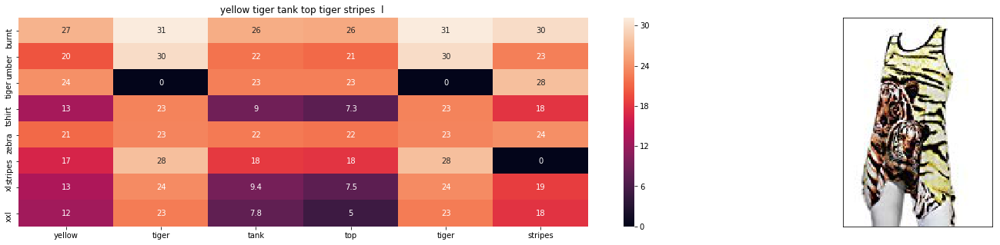

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 3.55186862964


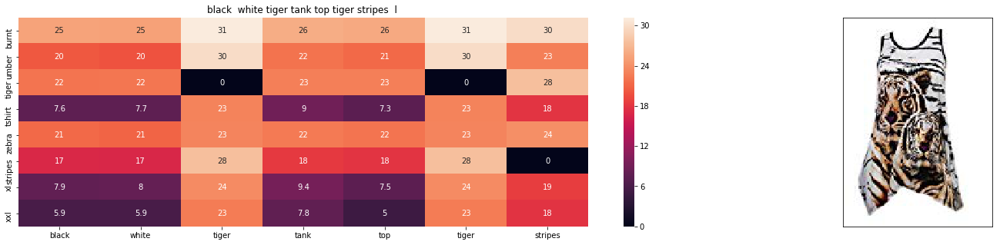

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 3.5536174776


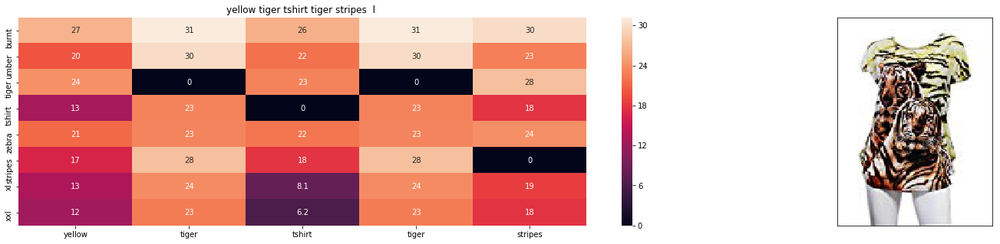

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 3.65382804889


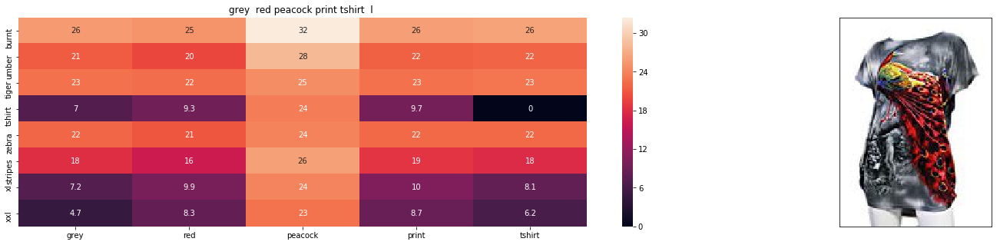

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.12881164569


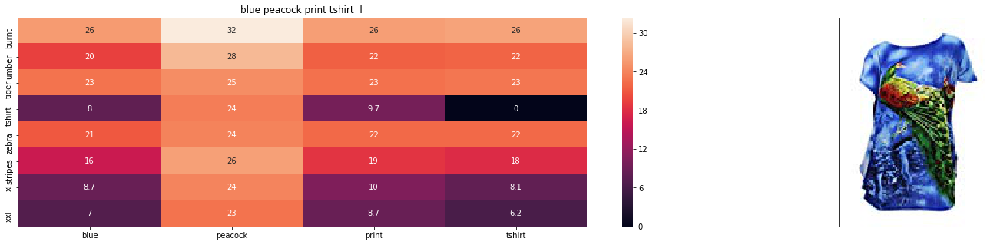

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 4.20390014667


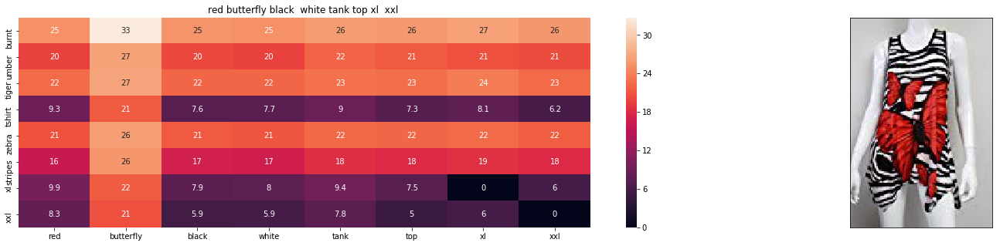

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.28658676166


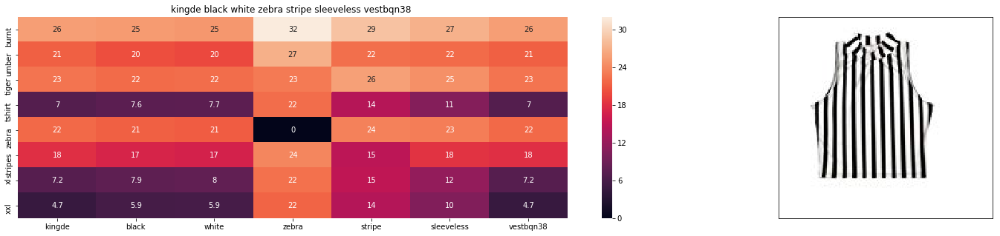

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 4.2912398131


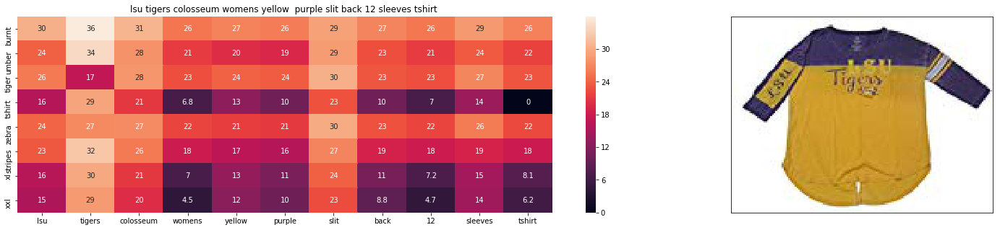

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 4.35309818102


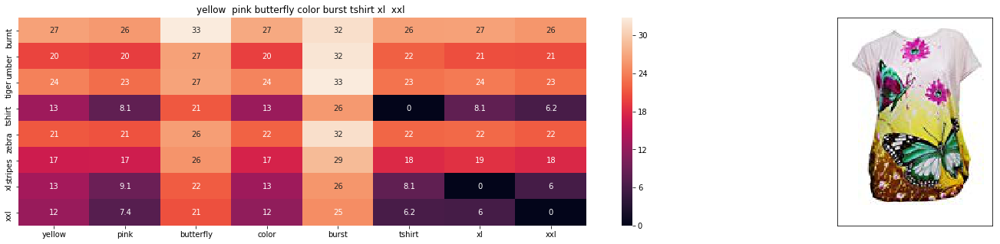

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.39791030902


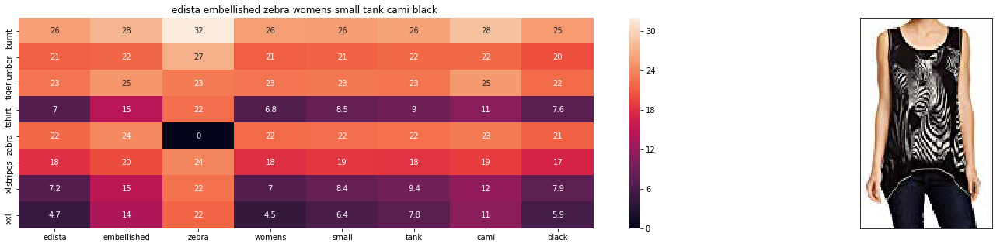

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 4.42084701373


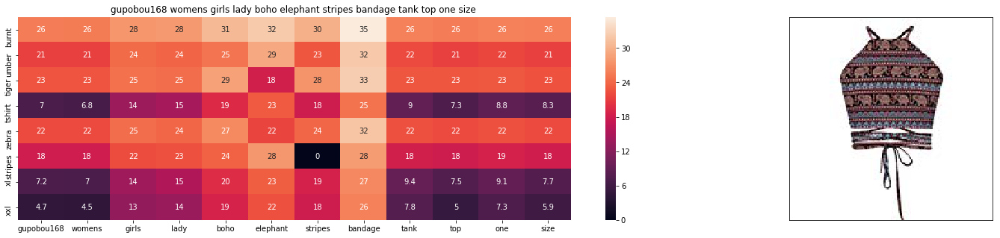

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 4.42878303528


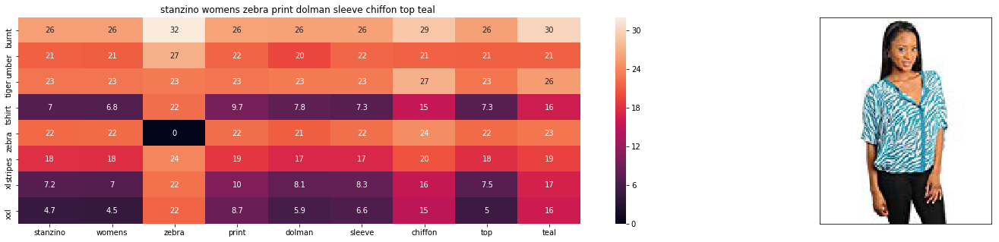

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 4.43219535662


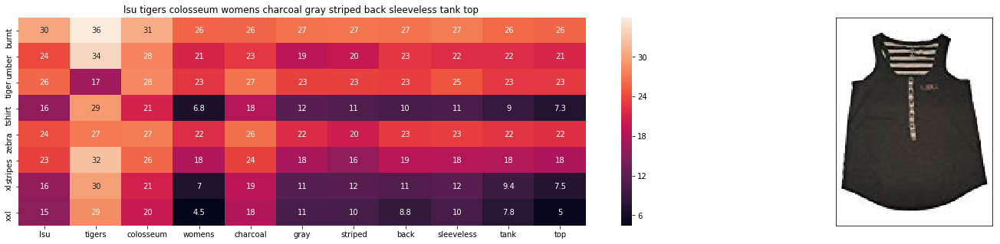

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 4.45022476031


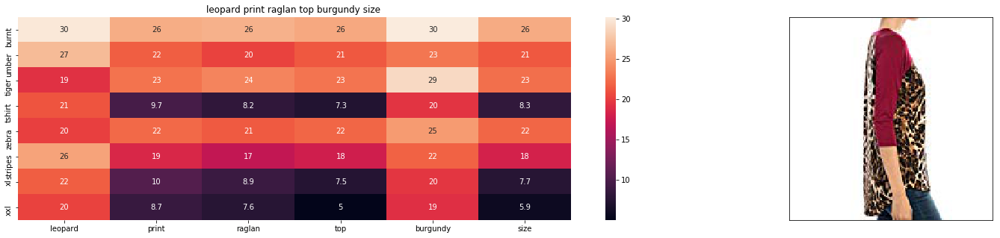

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 4.45644958331


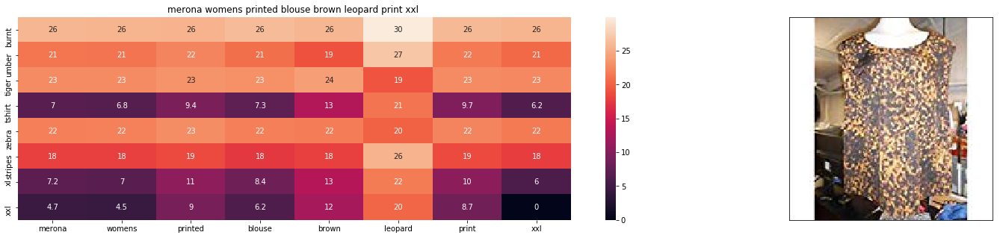

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 4.51249664141


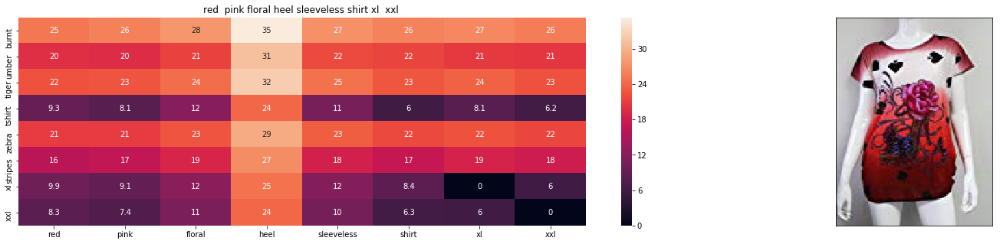

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.52937507647


In [78]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

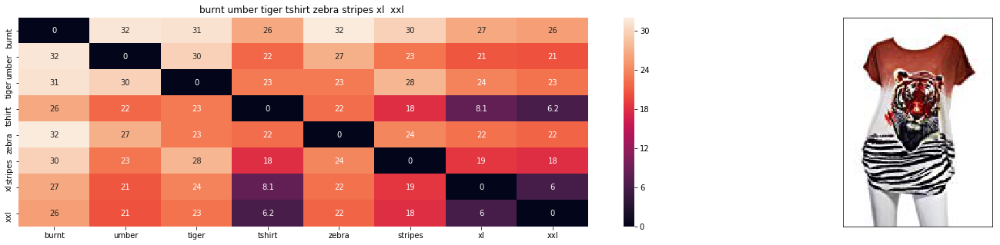

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.000355113636364


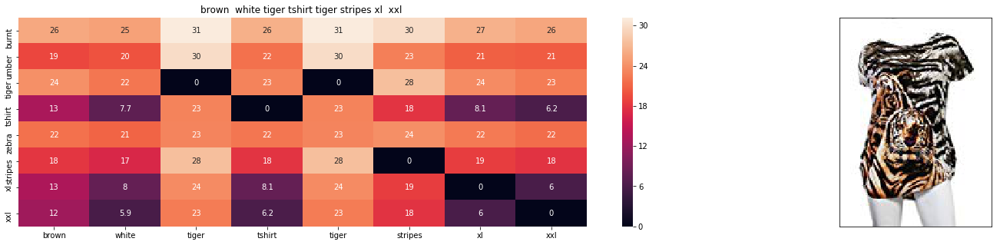

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.433722027865


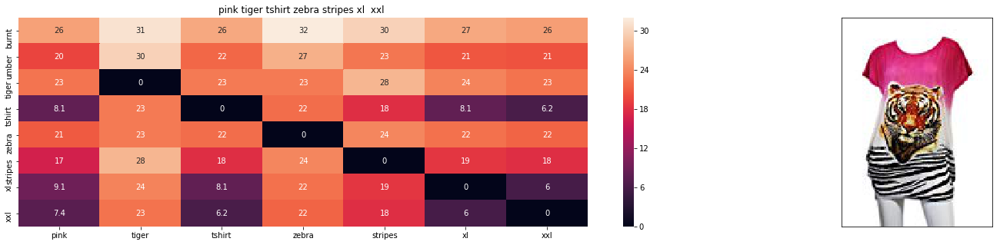

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 1.65509310669


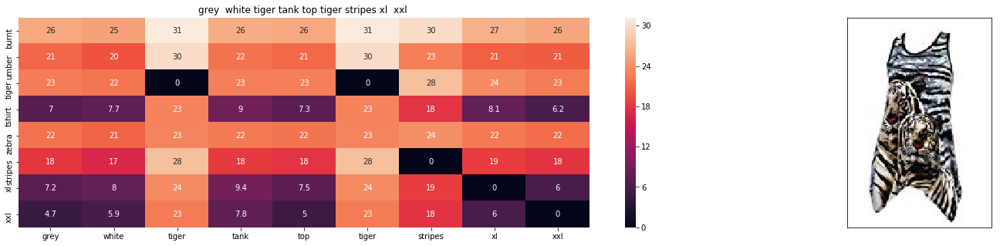

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 1.77293604103


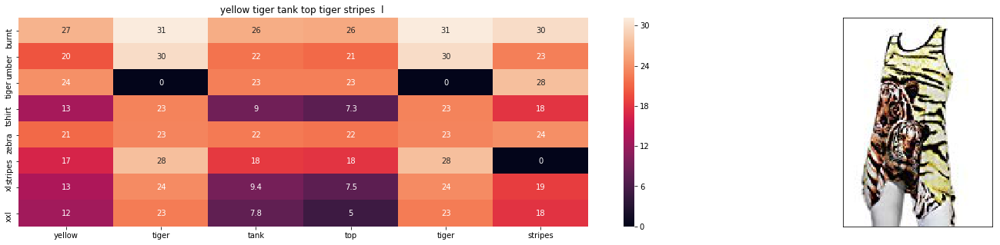

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 1.80287812006


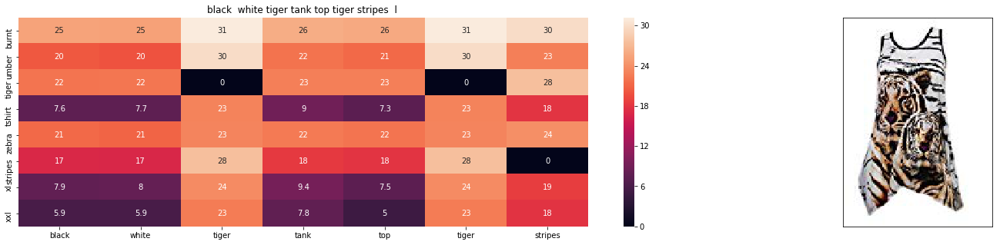

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 1.80319609241


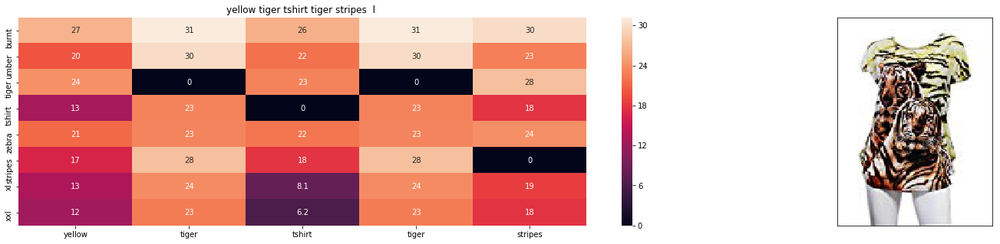

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 1.82141619628


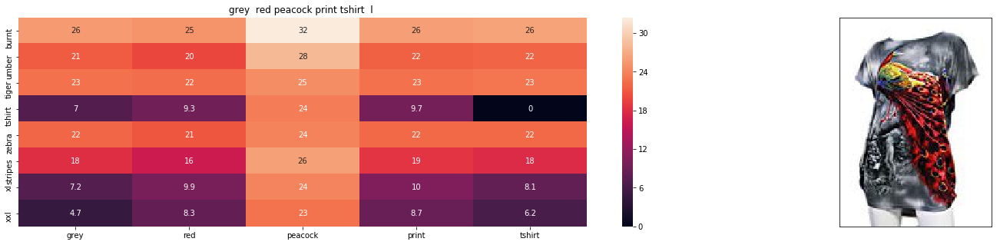

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 1.90777685025


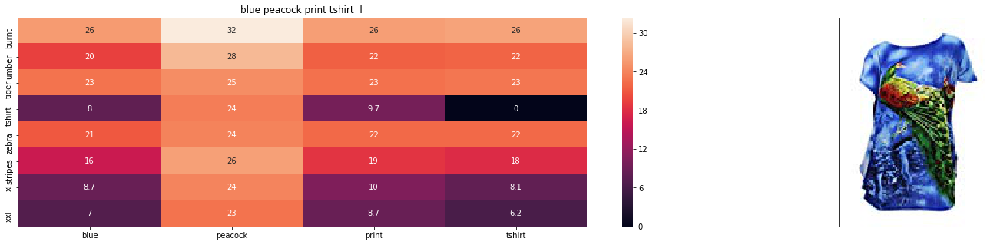

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 1.92142930497


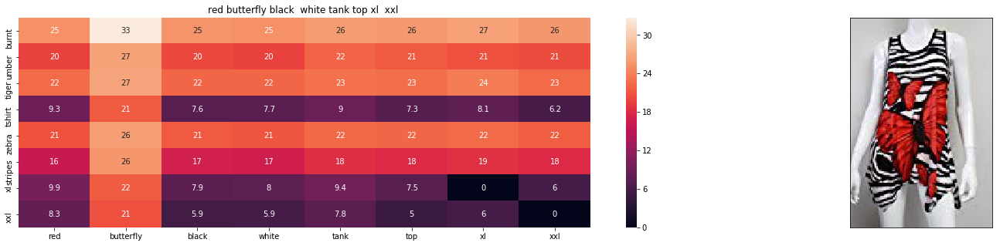

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 1.93646323497


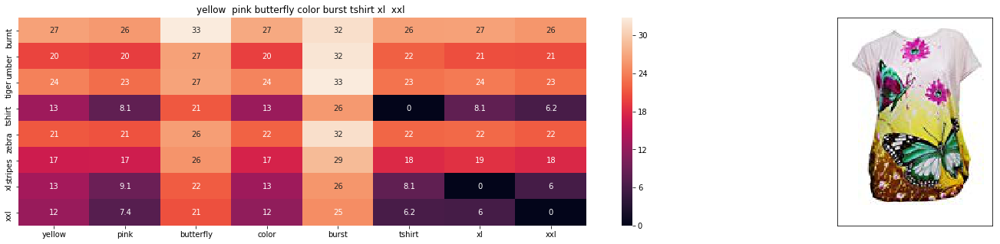

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 1.95670387995


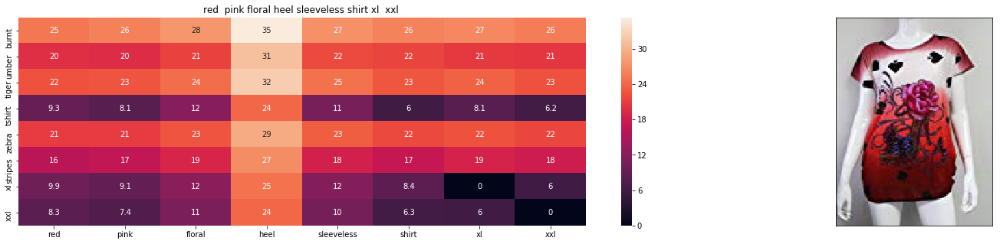

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 1.98060656494


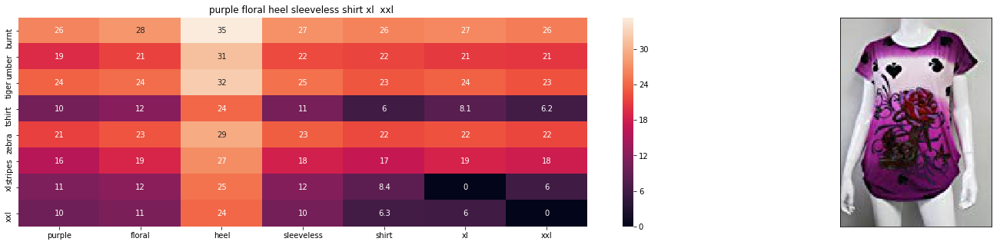

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 2.01218559992


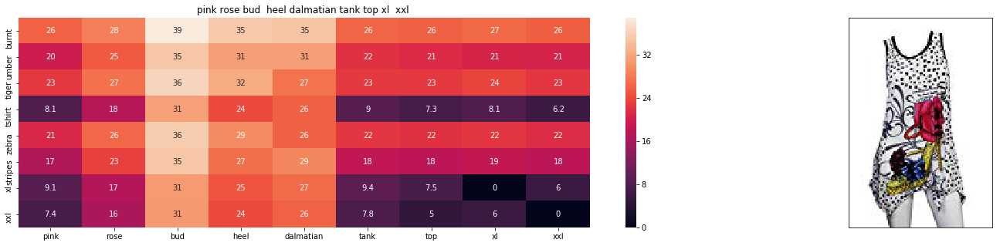

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 2.01335178755


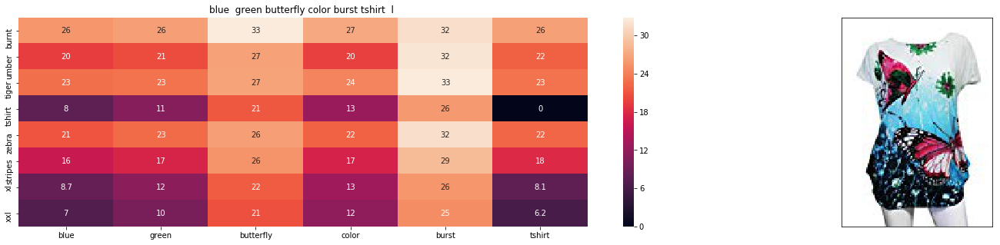

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 2.01388334827


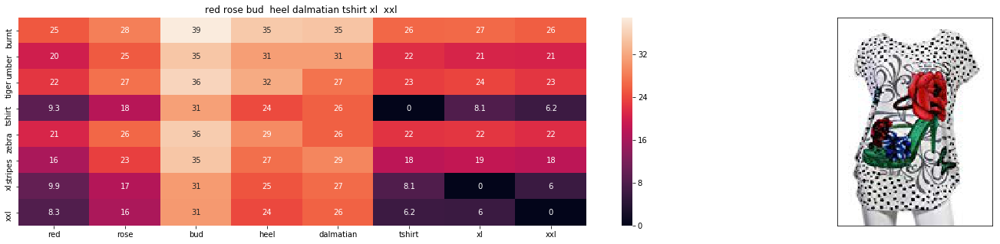

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 2.03672582486


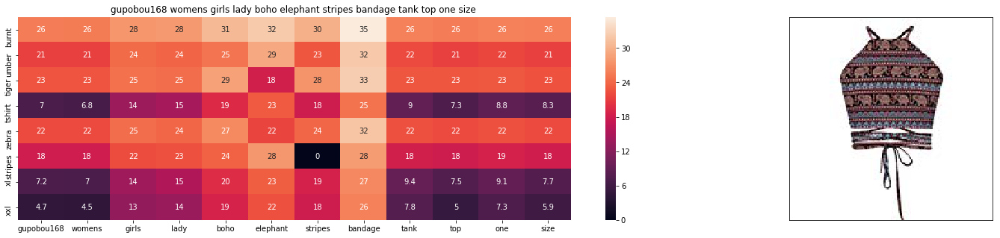

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 2.44159691551


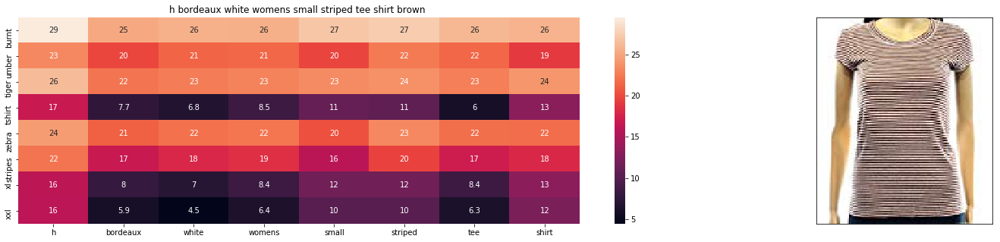

ASIN : B072BVB47Z
Brand : H By Bordeaux
euclidean distance from input : 2.46664095792


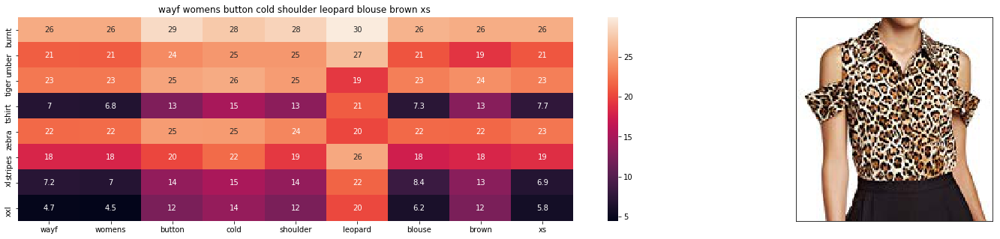

ASIN : B01LZ7BQ4H
Brand : WAYF
euclidean distance from input : 2.47029953003


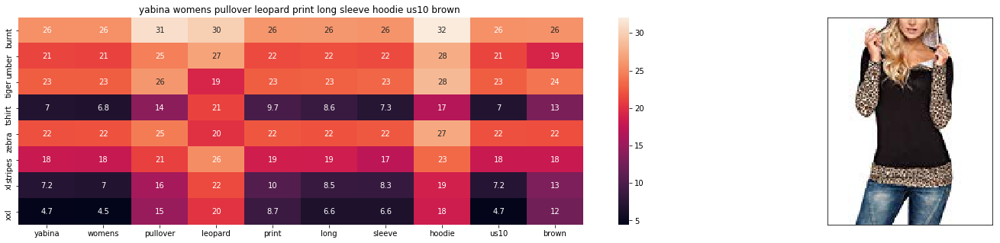

ASIN : B01KJUM6JI
Brand : YABINA
euclidean distance from input : 2.47123094039


In [79]:
idf_w2v_brand(12566,5,50,20)

# Keras and Tensorflow to extract the features

In [82]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
import tensorflow as tf

# Visual features based product similarity

In [84]:
bottleneck_features_train=np.load('16k_data_cnn_features.npy')
asins=np.load('16k_data_cnn_feature_asins.npy')
asins=list(asins)

In [85]:
bottleneck_features_train.shape

(16042, 25088)

In [87]:
data=pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins=list(data['asin'])

In [88]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [90]:
from IPython.display import display, Image, SVG, Math, YouTubeVideo

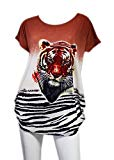

Product Title:  burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 0.0625
Amazon Url: www.amzon.com/dp/B00JXQB5FQ


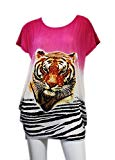

Product Title:  pink tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 30.0501
Amazon Url: www.amzon.com/dp/B00JXQASS6


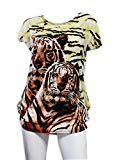

Product Title:  yellow tiger tshirt tiger stripes  l 
Euclidean Distance from input image: 41.2611
Amazon Url: www.amzon.com/dp/B00JXQCUIC


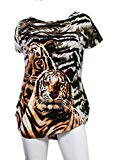

Product Title:  brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean Distance from input image: 44.0002
Amazon Url: www.amzon.com/dp/B00JXQCWTO


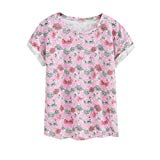

Product Title:  kawaii pastel tops tees pink flower design 
Euclidean Distance from input image: 47.3825
Amazon Url: www.amzon.com/dp/B071FCWD97


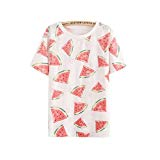

Product Title:  womens thin style tops tees pastel watermelon print 
Euclidean Distance from input image: 47.7184
Amazon Url: www.amzon.com/dp/B01JUNHBRM


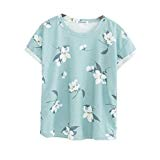

Product Title:  kawaii pastel tops tees baby blue flower design 
Euclidean Distance from input image: 47.9021
Amazon Url: www.amzon.com/dp/B071SBCY9W


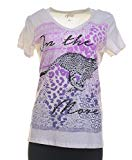

Product Title:  edv cheetah run purple multi xl 
Euclidean Distance from input image: 48.0465
Amazon Url: www.amzon.com/dp/B01CUPYBM0


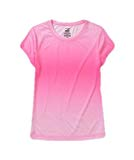

Product Title:  danskin womens vneck loose performance tee xsmall pink ombre 
Euclidean Distance from input image: 48.1019
Amazon Url: www.amzon.com/dp/B01F7PHXY8


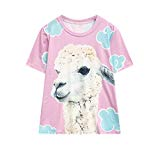

Product Title:  summer alpaca 3d pastel casual loose tops tee design 
Euclidean Distance from input image: 48.1189
Amazon Url: www.amzon.com/dp/B01I80A93G


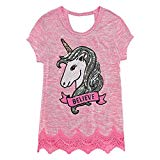

Product Title:  miss chievous juniors striped peplum tank top medium shadowpeach 
Euclidean Distance from input image: 48.1313
Amazon Url: www.amzon.com/dp/B0177DM70S


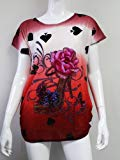

Product Title:  red  pink floral heel sleeveless shirt xl  xxl 
Euclidean Distance from input image: 48.1695
Amazon Url: www.amzon.com/dp/B00JV63QQE


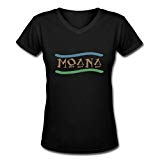

Product Title:  moana logo adults hot v neck shirt black xxl 
Euclidean Distance from input image: 48.2568
Amazon Url: www.amzon.com/dp/B01LX6H43D


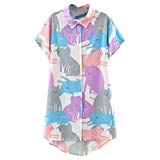

Product Title:  abaday multicolor cartoon cat print short sleeve longline shirt large 
Euclidean Distance from input image: 48.2656
Amazon Url: www.amzon.com/dp/B01CR57YY0


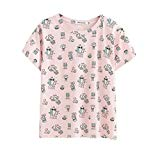

Product Title:  kawaii cotton pastel tops tees peach pink cactus design 
Euclidean Distance from input image: 48.3626
Amazon Url: www.amzon.com/dp/B071WYLBZS


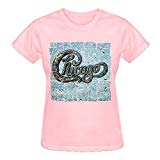

Product Title:  chicago chicago 18 shirt women pink 
Euclidean Distance from input image: 48.3836
Amazon Url: www.amzon.com/dp/B01GXAZTRY


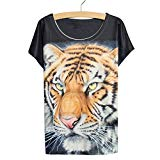

Product Title:  yichun womens tiger printed summer tshirts tops 
Euclidean Distance from input image: 48.4493
Amazon Url: www.amzon.com/dp/B010NN9RXO


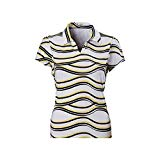

Product Title:  nancy lopez whimsy short sleeve  whiteblacklemon drop  xs 
Euclidean Distance from input image: 48.4789
Amazon Url: www.amzon.com/dp/B01MPX6IDX


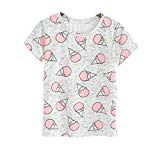

Product Title:  womens tops tees pastel peach ice cream cone print 
Euclidean Distance from input image: 48.558
Amazon Url: www.amzon.com/dp/B0734GRKZL


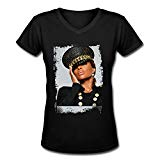

Product Title:  uswomens mary j blige without tshirts shirt 
Euclidean Distance from input image: 48.6144
Amazon Url: www.amzon.com/dp/B01M0XXFKK


In [96]:
def get_similar_products_cnn(doc_id,num_results):
    doc_id=asins.index(df_asins[doc_id])
    pairwise_dist=pairwise_distances(bottleneck_features_train,bottleneck_features_train[doc_id].reshape(1,-1))
    indices=np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists=np.sort(pairwise_dist.flatten())[0:num_results]
    for i in range(len(indices)):
        rows=data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])
get_similar_products_cnn(12566,20)                   

# Product similarity by concatenating Text, Color , Brand ,Type and Images

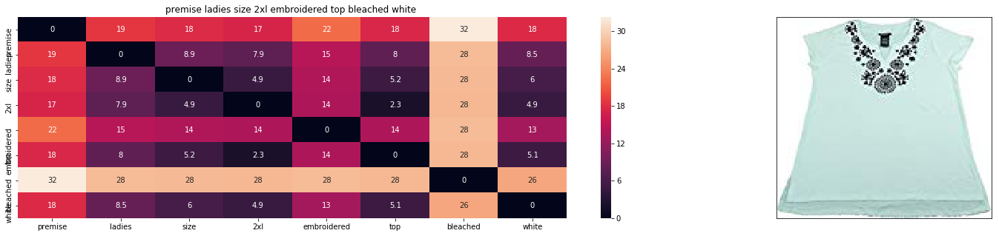

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 2.39820266745


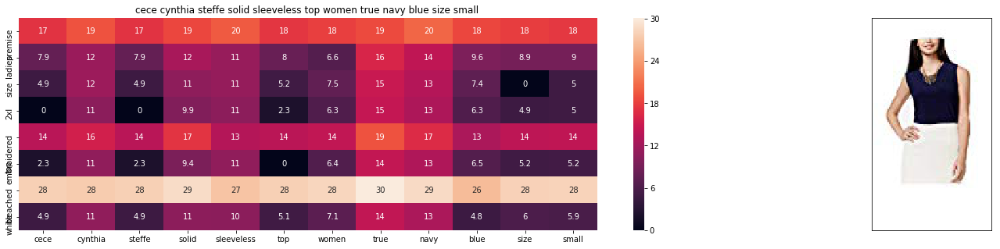

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 8.44780746482


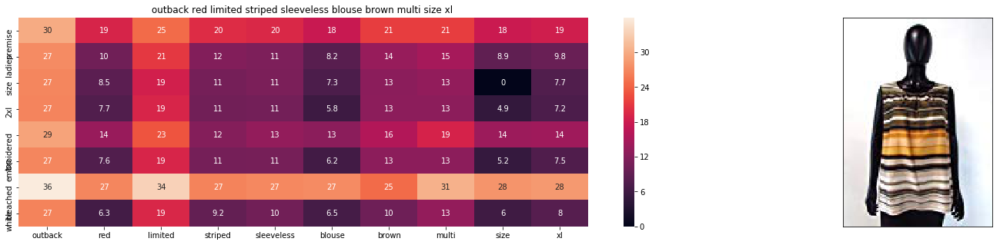

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 10.6237205508


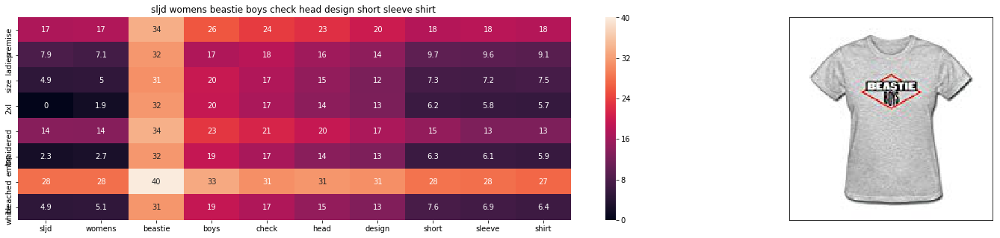

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 11.3112695315


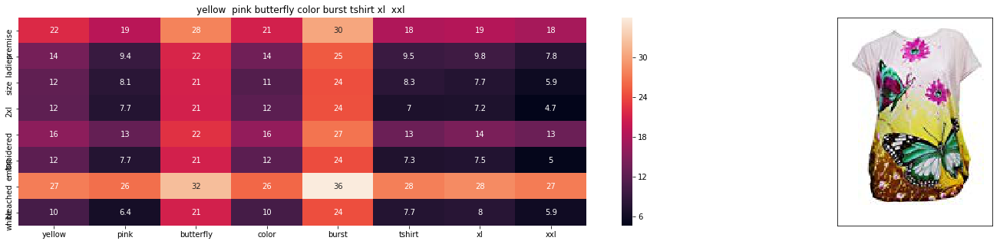

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 11.5827664185


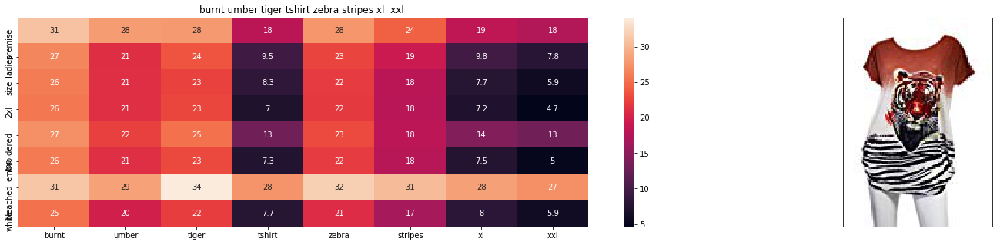

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 11.8132287598


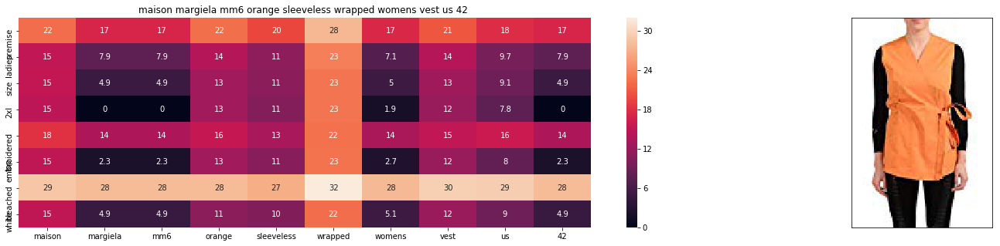

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 11.9038546755


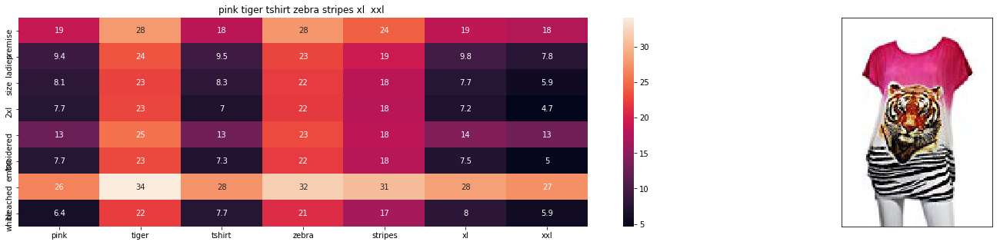

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 11.9105142213


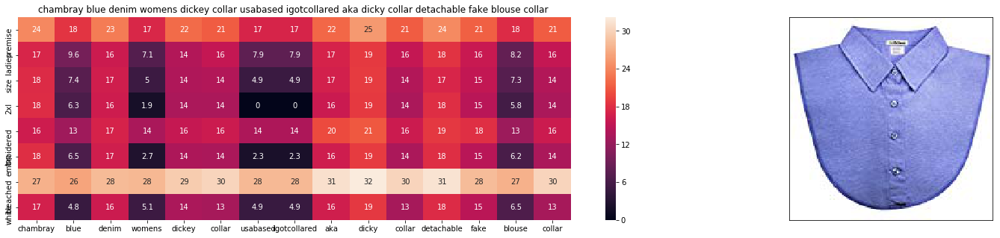

ASIN : B01MQWKWME
Brand : IGotCollared
euclidean distance from input : 11.9356820681


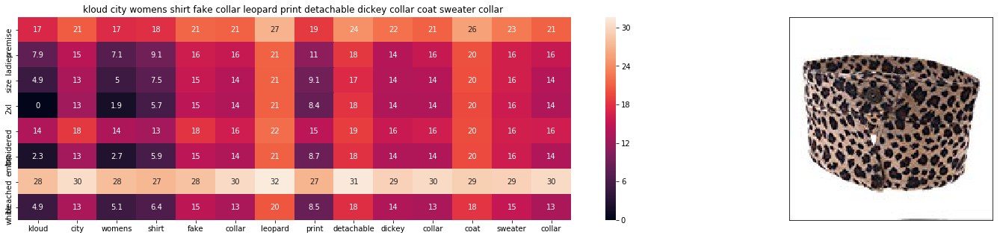

ASIN : B01NBM80SP
Brand : KLOUD City
euclidean distance from input : 11.9666044618


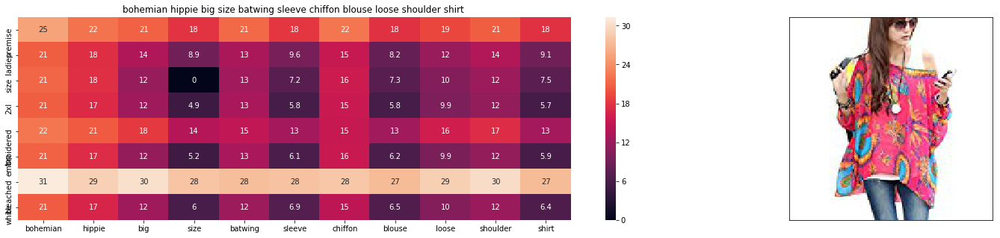

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 11.9933456422


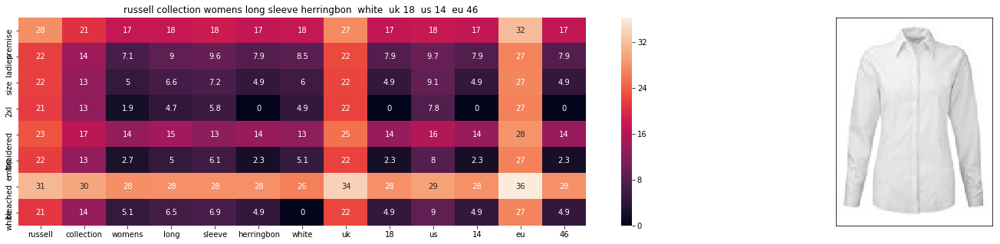

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 12.0318316653


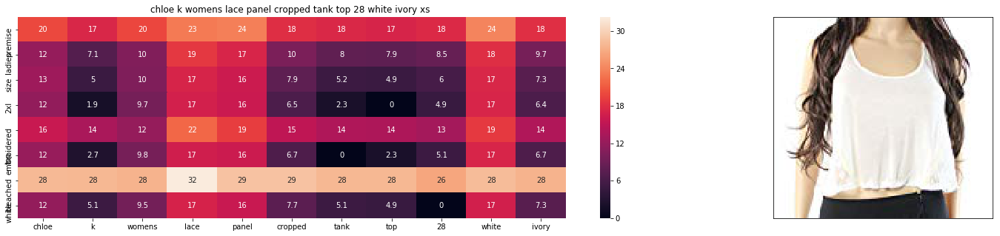

ASIN : B071VZCT5W
Brand : Chloe K.
euclidean distance from input : 12.032742615


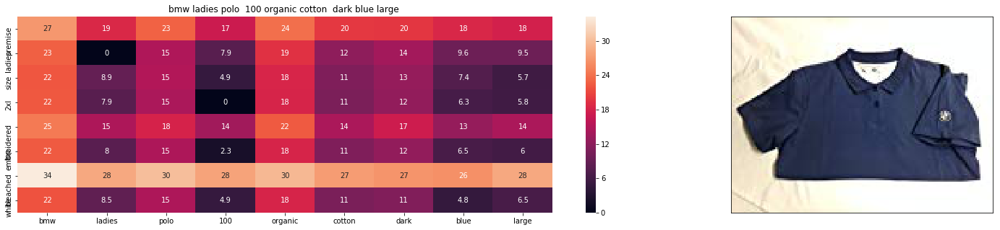

ASIN : B0060MKVX8
Brand : None
euclidean distance from input : 12.0713858034


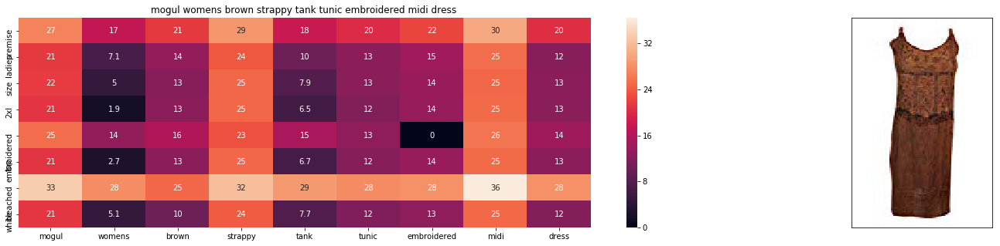

ASIN : B07191F766
Brand : Mogul Interior
euclidean distance from input : 12.0888447572


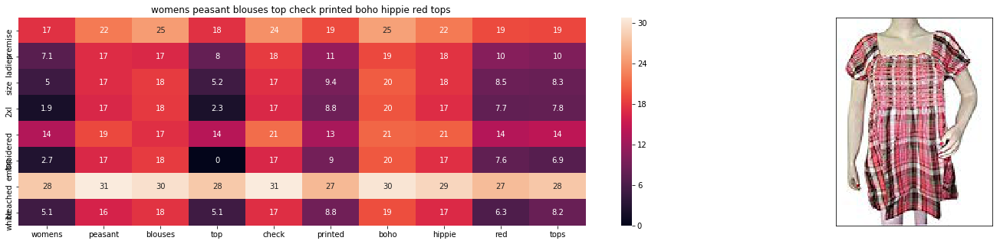

ASIN : B01MXMG6KB
Brand : Mogul Interior
euclidean distance from input : 12.1014028933


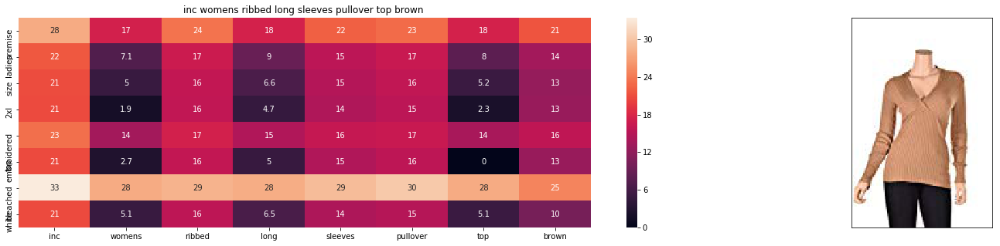

ASIN : B010OVNTHA
Brand : INC International Concepts
euclidean distance from input : 12.113874817


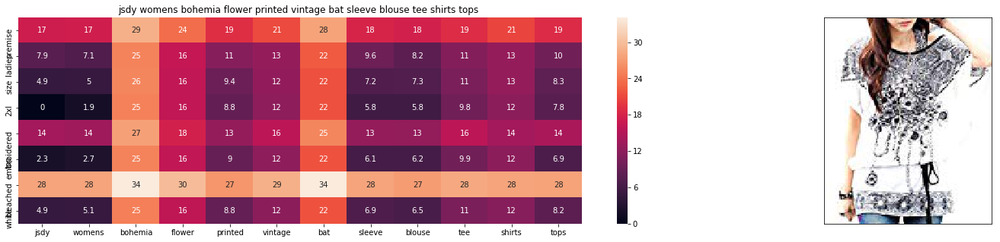

ASIN : B00L8RE3PC
Brand : JSDY-Cloth
euclidean distance from input : 12.1303440301


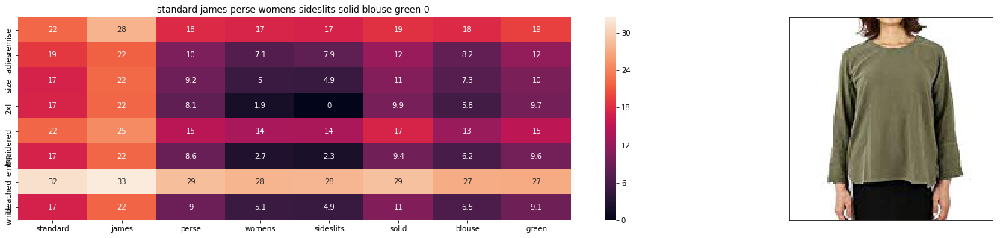

ASIN : B071LMW4YG
Brand : Standard James Perse
euclidean distance from input : 12.1386387636


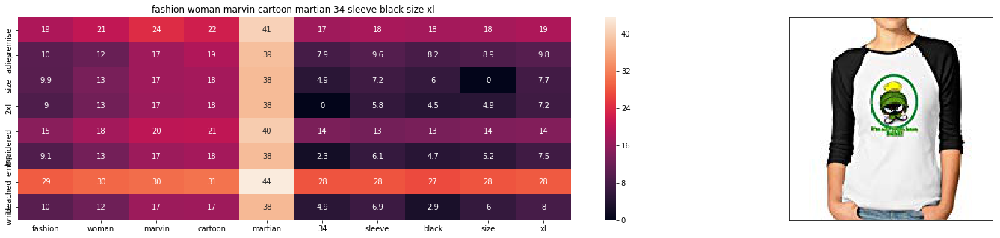

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 12.140318146


In [111]:
def product_similarity_all_features(doc_id,w1,w2,w3,w4,w5,num_results):
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist=pairwise_distances(brand_features,brand_features[doc_id])
    color_dist=pairwise_distances(color_features,color_features[doc_id])
    type_dist=pairwise_distances(types_features,types_features[doc_id])
    doc_id=asins.index(df_asins[doc_id])
    cnn_features_dist=pairwise_distances(bottleneck_features_train,bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * type_dist + w5 * cnn_features_dist)/float(w1 + w2 + w3 + w4 + w5)
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]

    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)
product_similarity_all_features(12566,5,5,5,5,5,20)            

# Observation

1. I have imported all the necessary library needed for this assignment
2. I have read the json file to fetch the data
3. I have performed data preprocessing and checked the Missing values  and duplicates of the different features present in the datasets
4. I have performed text preprocessing and converted the title into tokens
5. I have created some generic function that I have used throughout the assignment
6. I have applied the some of the vectorizer Like Bag of Words, Tf-idf, Avergae Word2Vec, Idf,to convert our text into vectors. 
7. I have applied different vectorizer to find the product similarity from a given query product. I have used euclidean distance to find out the similar products based on text
8. I have used other feature vectors like Color, Type and Brand and concatenate with our text vectors to find similar products based on the weighted euclidean distance
9. I have also used convolution neural network to find out the feature vectors from the images.
10.I have concatenated all the features text, Brand,Color , Type and Image features and applied weighted euclidean distance to find out the similar products 